### Library

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
pd.set_option('display.max_columns', None)
import matplotlib.ticker as ticker

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import SGD

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Load Data

In [ ]:
def load_data(path):
  df_original = pd.read_csv(path)
  df = df_original.copy()

  # change date column into datetime
  df['date'] = pd.to_datetime(df['date'])

  # set date as index
  df.set_index('date', inplace = True)

  # derive hour, month, day, and season
  df['hour']=df.index.hour
  df['month']=df.index.month
  df['day']=df.index.day
  df['season']=pd.cut(df.index.month, bins = [0,3,6,9,12], labels = ['winter', 'spring', 'summer', 'fall'])

  return df

df = load_data('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/cleaned_weather.csv')

Missing values note:
- wv : 1 row with -9999
- max PAR: 30 rows with -9999, replace with value of PAR after consulting the pairplot

In [ ]:
def impute(df):
    #replace minimum max. Par of -9999 with PAR values
    df.loc[df['max. PAR'] == -9999, 'max. PAR'] = df.loc[df['max. PAR'] == -9999, 'PAR']
    #replace minimum wv of -9999 with 0
    df.loc[df['wv'] == -9999, 'wv'] = 0
    return df

df = impute(df)

In [ ]:
def rename_input(df):
  df.rename(columns = {'max. PAR':'maxPAR'}, inplace = True)
  df.rename(columns = {'max. wv':'maxwv'}, inplace = True)
  return df

df = rename_input(df)

In [ ]:
print(df.info())
print('\n')
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 24 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   p        52696 non-null  float64 
 1   T        52696 non-null  float64 
 2   Tpot     52696 non-null  float64 
 3   Tdew     52696 non-null  float64 
 4   rh       52696 non-null  float64 
 5   VPmax    52696 non-null  float64 
 6   VPact    52696 non-null  float64 
 7   VPdef    52696 non-null  float64 
 8   sh       52696 non-null  float64 
 9   H2OC     52696 non-null  float64 
 10  rho      52696 non-null  float64 
 11  wv       52696 non-null  float64 
 12  maxwv    52696 non-null  float64 
 13  wd       52696 non-null  float64 
 14  rain     52696 non-null  float64 
 15  raining  52696 non-null  float64 
 16  SWDR     52696 non-null  float64 
 17  PAR      52696 non-null  float64 
 18  maxPAR   52696 non-null  float64 
 19  Tlog     52696 non-null  float64

### Check Pearson Correlation

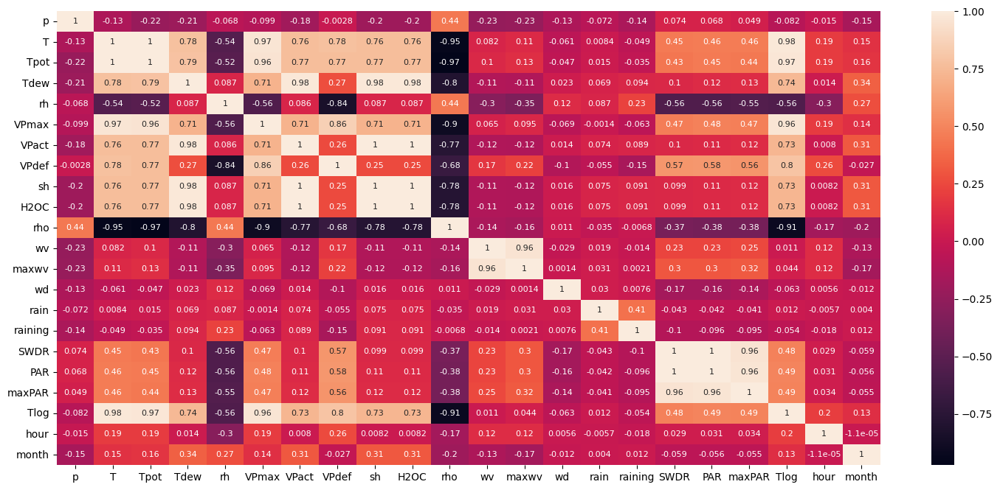

                p         T      Tpot      Tdew        rh     VPmax     VPact  \
p        1.000000 -0.127305 -0.223450 -0.207280 -0.068386 -0.098905 -0.183765   
T       -0.127305  1.000000  0.995228  0.782740 -0.540784  0.967901  0.762860   
Tpot    -0.223450  0.995228  1.000000  0.789478 -0.524880  0.961013  0.767773   
Tdew    -0.207280  0.782740  0.789478  1.000000  0.087203  0.712665  0.977413   
rh      -0.068386 -0.540784 -0.524880  0.087203  1.000000 -0.561612  0.085528   
VPmax   -0.098905  0.967901  0.961013  0.712665 -0.561612  1.000000  0.712554   
VPact   -0.183765  0.762860  0.767773  0.977413  0.085528  0.712554  1.000000   
VPdef   -0.002805  0.779616  0.766556  0.272064 -0.836007  0.860390  0.255506   
sh      -0.200955  0.761550  0.768193  0.976878  0.086812  0.711273  0.999814   
H2OC    -0.201174  0.761934  0.768590  0.977256  0.086729  0.711482  0.999816   
rho      0.437434 -0.946510 -0.973132 -0.798148  0.440074 -0.900199 -0.771779   
wv      -0.233252  0.081629 

In [ ]:
def correlation_matrix(df):
    correlation = df.drop(['season', 'day'], axis=1).corr()

    # make pearson correlation with small annotation size
    plt.figure(figsize=(18,8))
    sns.heatmap(correlation, annot=True, annot_kws = {'size':8})
    plt.show()
    print (correlation)

    return correlation

correlation = correlation_matrix(df)

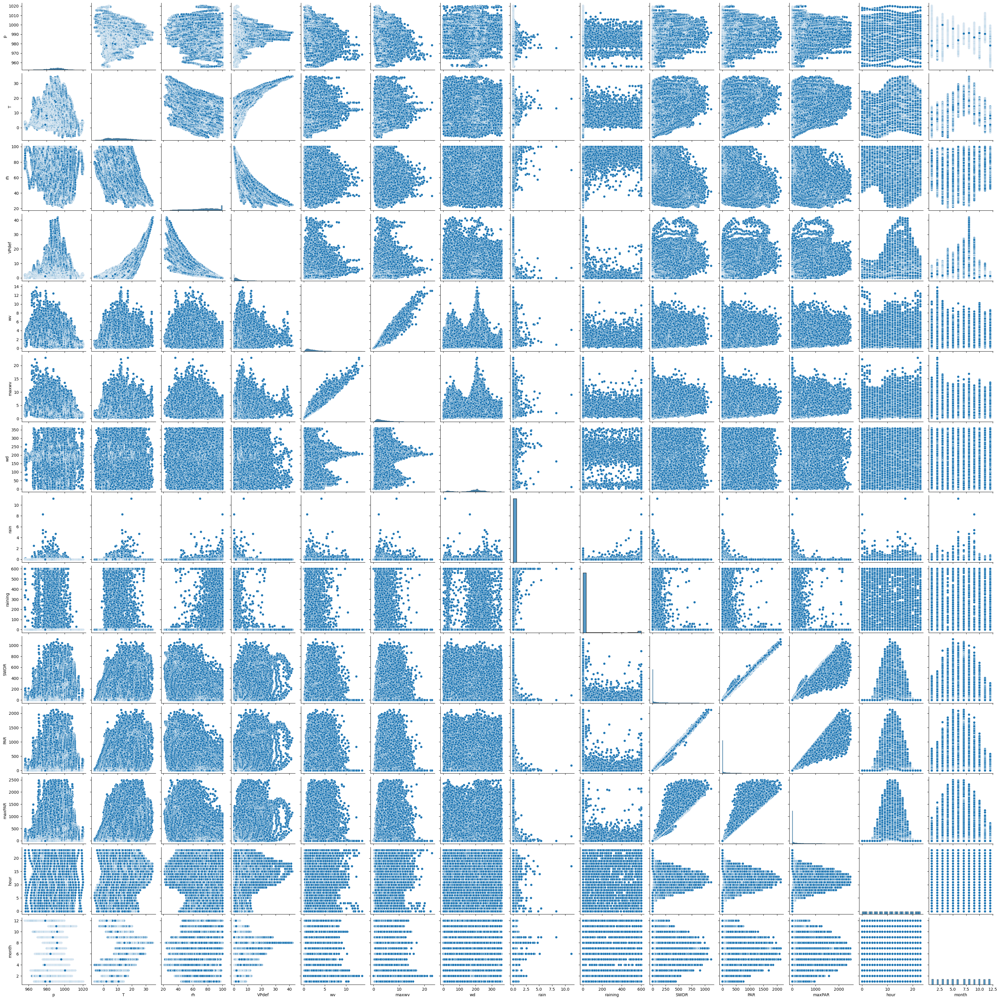

In [ ]:
# make pairplot
pairplot = df.drop(['season', 'day', 'Tpot', 'Tdew','sh', 'H2OC', 'VPmax', 'VPact', 'rho', 'Tlog'], axis=1)
sns.pairplot(pairplot)

### EDA

In [ ]:
def plot_histograms(df, columns_info, nrows=3, ncols=3, figsize=(16, 10)):
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    for i, (col, title, xlabel) in enumerate(columns_info):
        sns.histplot(df[col], ax=axes[i])
        axes[i].set_title(title)
        axes[i].set_xlabel(xlabel)
        axes[i].set_ylabel("frequency")

    # Hide unused subplots if any
    for j in range(len(columns_info), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

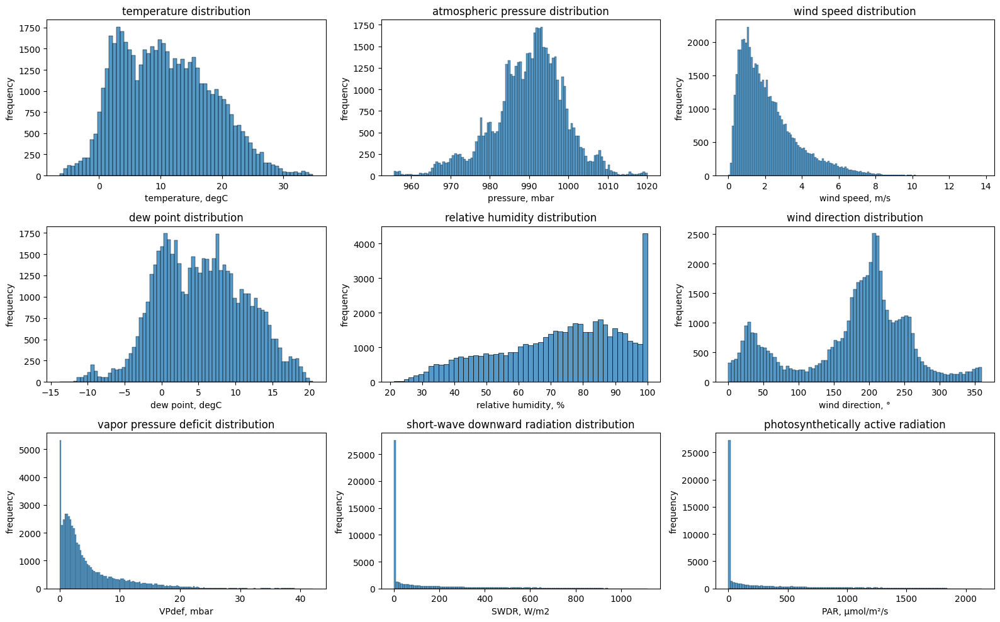

In [ ]:
columns_info = [
    ('T', "temperature distribution", "temperature, degC"),
    ('p', "atmospheric pressure distribution", "pressure, mbar"),
    ('wv', "wind speed distribution", "wind speed, m/s"),
    ('Tdew', "dew point distribution", "dew point, degC"),
    ('rh', "relative humidity distribution", "relative humidity, %"),
    ('wd', "wind direction distribution", "wind direction, °"),
    ('VPdef', "vapor pressure deficit distribution", "VPdef, mbar"),
    ('SWDR', "short-wave downward radiation distribution", "SWDR, W/m2"),
    ('PAR', "photosynthetically active radiation", "PAR, µmol/m²/s"),
]
plot_histograms(df, columns_info)

In [ ]:
#check daily statistics for T, Tdew, rh, wv, maxwv, wd, rain, SWDR, PAR, maxPAR
daily_stats = df.resample('D').agg({
    'T': ['mean', 'min', 'max'],
    'Tdew': ['mean'],
    'rh': ['mean'],
    'wv': ['mean'],
    'maxwv': ['mean'],
    'wd': ['median'],
    'rain': ['sum'],
    'SWDR': ['sum'],
    'PAR': ['sum'],
    'maxPAR': ['sum']
})
daily_stats.head()

T                  Tdew         rh        wv     maxwv  \
                mean   min   max      mean       mean      mean      mean   
date                                                                        
2020-01-01 -0.514196 -3.46  4.58 -2.569231  86.429301  0.783287  1.456573   
2020-01-02 -1.056319 -5.78  6.47 -4.215069  80.206042  1.173403  2.133542   
2020-01-03  4.835278  0.69  8.17  2.006806  81.975000  3.927153  6.106319   
2020-01-04  3.784931  1.47  6.61  0.785764  80.899861  2.261667  4.695347   
2020-01-05  2.735000  1.47  4.43 -1.018611  76.422639  1.791528  2.812431   

                wd rain     SWDR       PAR    maxPAR  
            median  sum      sum       sum       sum  
date                                                  
2020-01-01  181.40  0.0  8250.91  13710.98  14184.91  
2020-01-02  174.35  0.0  9570.44  13946.31  14439.75  
2020-01-03  196.60  0.3  1665.99   3622.40   4313.68  
2020-01-04  251.15  4.8  1157.79   2714.67   3110.59  
2020-01-05  225.10  0.0  4572.03   9396.10  11097.82

In [ ]:
# check extreme events
def analyze_extreme_events(df):
    """
    Identify and analyze extreme weather events
    """
    extremes = {
        'Highest_temp, degC': df['T'].max(),
        'Lowest_temp, degC': df['T'].min(),
        'Hottest_day': df.resample('D')['T'].mean().idxmax(),
        'Coldest_day': df.resample('D')['T'].mean().idxmin(),
        'Max_daily_rain, mm': df.resample('D')['rain'].sum().max(),
        'Highest_wind, m/s': df['wv'].max(),
        'Prevailing_wind_direction, deg': df.groupby('wd')['wv'].count().idxmax(),
        'Day_with_highest_wind_speed':df.resample('D')['wv'].max().idxmax(),
        'Highest_radiation, W/m2':df['SWDR'].max(),
        'Max_daily_radiation, W/m2': df.resample('D')['SWDR'].sum().max(),
        'Day_with_highest_radiation': df.resample('D')['SWDR'].sum().idxmax(),
        'Average daily wind speed, m/s': df.resample('D')['wv'].mean().mean(),
        }

    return extremes

# Extreme events
print("\nExtreme weather events:")
extremes = analyze_extreme_events(df)
for event, value in extremes.items():
    print(f"{event}: {value}")


Extreme weather events:
Highest_temp, degC: 34.8
Lowest_temp, degC: -6.44
Hottest_day: 2020-08-08 00:00:00
Coldest_day: 2020-01-25 00:00:00
Max_daily_rain, mm: 46.4
Highest_wind, m/s: 13.77
Prevailing_wind_direction, deg: 210.3
Day_with_highest_wind_speed: 2020-02-10 00:00:00
Highest_radiation, W/m2: 1115.29
Max_daily_radiation, W/m2: 49617.22
Day_with_highest_radiation: 2020-06-01 00:00:00
Average daily wind speed, m/s: 2.1813410879399204


In [ ]:
def plot_meteorological_patterns(df, figsize=(16, 10), nrows=4, ncols=3):
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    plots = [
        # Row 1: Hourly line plots
        ('line', df.groupby('hour')['T'].mean(), "average hourly temperature", "hour of the day", "temperature, degC"),
        ('line', df.groupby('hour')['SWDR'].sum(), "average hourly solar radiation", "hour of the day", "solar radiation, W/m^2"),
        ('line', df.groupby('hour')['wv'].mean(), "average hourly wind speed", "hour of the day", "wind speed, m/s"),

        # Row 2: Monthly boxplots
        ('box', ('month', 'T'), "monthly temperature variation", "month", "temperature, degC"),
        ('box', ('month', 'SWDR'), "monthly solar radiation variation", "month", "solar radiation, W/m^2"),
        ('box', ('month', 'wv'), "monthly wind speed variation", "month", "wind speed, m/s"),

        # Row 3: More boxplots and a barplot
        ('box', ('month', 'wd'), "monthly wind direction variation", "month", "wind direction, deg"),
        ('bar', df.groupby('month')['rain'].sum(), "monthly rainfall variation", "month", "rainfall, mm"),
        ('box', ('month', 'maxwv'), "monthly maximum windspeed variation", "month", "wind speed, m/s"),

        # Row 4: More hourly line plots
        ('line', df.groupby('hour')['rh'].mean(), "average hourly humidity", "hour of the day", "rel humidity, %"),
        ('line', df.groupby('hour')['Tdew'].mean(), "average hourly dew point", "hour of the day", "dew point, degC"),
    ]

    for i, (plot_type, data, title, xlabel, ylabel) in enumerate(plots):
        ax = axes[i]

        if plot_type == 'line':
            sns.lineplot(x=data.index, y=data.values, ax=ax)
        elif plot_type == 'box':
            x, y = data
            sns.boxplot(x=x, y=y, data=df, ax=ax)
        elif plot_type == 'bar':
            sns.barplot(x=data.index, y=data.values, ax=ax)

        ax.set_title(title)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)

    # Hide remaining unused axes
    for j in range(len(plots), len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

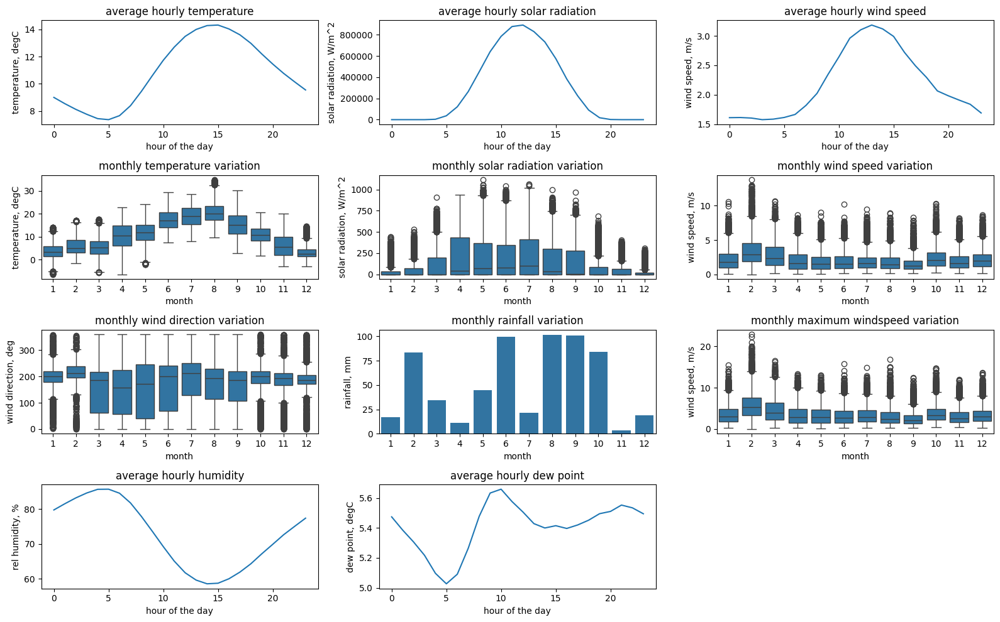

In [ ]:
plot_meteorological_patterns(df)

- The highest average solar radiation (SWDR) and the highest average wind speed happen at similar hours of the day
- higher solar radiation during hotter months (April to August) as expected
- dominant wind direction records with more anomalies during colder months (October - December, January - February)
- desirable wind speed is above 5 m/s for wind farm, seems to indicate some potential through out the year, with highest wind speed recorded around January - February.
- according to the polar plot below, the wind speed > 5 m/s is also predominantly in the SSW direction, similar to majority of wind direction recorded.
- higher humidity is non ideal for solar panel efficiency, as more moisture affects sunlight absorption, and higher humidity cause higher temperature that reduce the efficiency of solar panel.
- dew point temperature, when crossed, means more condensation that can reduce the light transmission to solar panel.


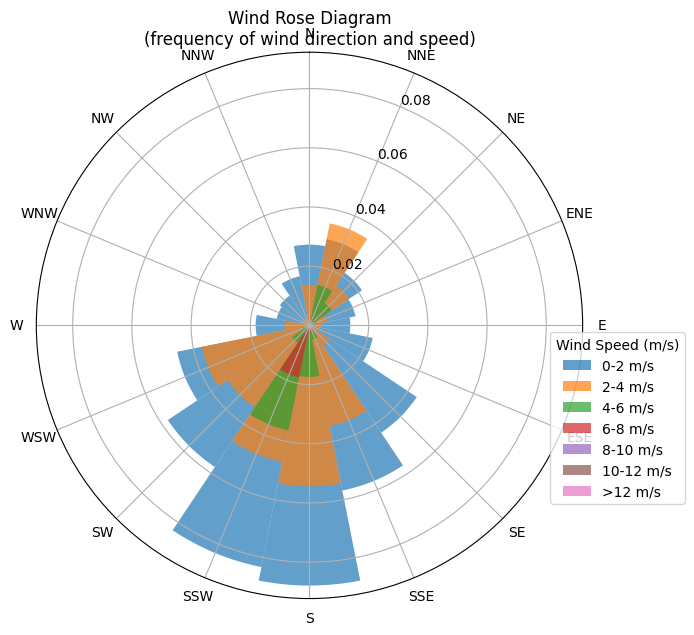

In [ ]:
# create a polar plot for wind speed and direction

#convert wind direction to radians
wd_rad = np.radians(df['wd'])
# Define wind speed bins
speed_bins = [0, 2, 4, 6, 8, 10, 12, np.inf]
speed_labels = ['0-2', '2-4','4-6', '6-8', '8-10','10-12', '>12']
# Create direction bins (16 compass directions)
dir_bins = np.linspace(0, 2*np.pi, 17)
dir_labels = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
                 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
#categorize wind speeds
df['speed_cat'] = pd.cut(df['wv'], bins=speed_bins, labels=speed_labels)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='polar')

for speed_label in speed_labels:
  mask = df['speed_cat'] == speed_label
  if mask.any():
    hist, _ = np.histogram(wd_rad[mask], bins=dir_bins)
    hist = hist / len(df)  # Convert to frequency
    width = dir_bins[1] - dir_bins[0]
    plt.bar(dir_bins[:-1], hist, width=width, bottom=0.0,
           label=f'{speed_label} m/s', alpha=0.7)

ax.set_theta_direction(-1)
ax.set_theta_zero_location('N')
ax.set_thetagrids(np.degrees(dir_bins[:-1]), dir_labels)
ax.set_title('Wind Rose Diagram\n(frequency of wind direction and speed)')
ax.legend(title='Wind Speed (m/s)', bbox_to_anchor=(1.2, 0.5))

plt.tight_layout()
plt.show()


dominant wind direction is a crucial information for
- large scale evacuation scenarios (avoid the likely direction of wind).
- placement of wind turbin in the case of wind farm
- containment of vapor or spray in the agricultural process

### Prepare Data for Feature Engineering

In [ ]:
df.columns

Index(['p', 'T', 'Tpot', 'Tdew', 'rh', 'VPmax', 'VPact', 'VPdef', 'sh', 'H2OC',
       'rho', 'wv', 'maxwv', 'wd', 'rain', 'raining', 'SWDR', 'PAR', 'maxPAR',
       'Tlog', 'hour', 'month', 'day', 'season', 'speed_cat'],
      dtype='object')

In [ ]:
#extract the feature columns for modelling
df_model = df.drop(['speed_cat', 'month', 'day'], axis=1)
df_model

,p,T,Tpot,Tdew,rh,VPmax,VPact,VPdef,sh,H2OC,rho,wv,maxwv,wd,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,season
date,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,5.49,1280.62,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,0,winter
2020-01-01 00:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,5.45,1280.33,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,0,winter
2020-01-01 00:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,5.43,1280.29,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,0,winter
2020-01-01 00:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,5.37,1281.97,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,0,winter
2020-01-01 00:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,5.42,1282.08,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,0,winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 23:20:00,978.32,2.28,277.16,-0.80,80.0,7.20,5.76,1.44,3.67,5.89,1234.61,0.73,1.40,180.6,0.0,0.0,0.0,0.0,0.0,13.40,23,fall
2020-12-31 23:30:00,978.30,2.13,277.01,-0.43,83.1,7.12,5.92,1.20,3.77,6.05,1235.20,0.43,0.82,174.0,0.0,0.0,0.0,0.0,0.0,13.42,23,fall
2020-12-31 23:40:00,978.26,1.99,276.88,-0.71,82.2,7.05,5.80,1.26,3.69,5.93,1235.82,0.38,0.76,248.9,0.0,0.0,0.0,0.0,0.0,13.45,23,fall


In [ ]:
# map the object data to numeric
df_model['season'] = df_model['season'].map({'winter': 0, 'spring': 1, 'summer': 2, 'fall': 3})
df_model['season'].unique()

[0, 1, 2, 3]
Categories (4, int64): [0 < 1 < 2 < 3]

In [ ]:
# feature engineering

# compute the sin and cosine of wd (wind direction)
df_model['wd_sin'] = np.sin(np.radians(df_model['wd']))
df_model['wd_cos'] = np.cos(np.radians(df_model['wd']))

# compute difference betweeen air temperature and dew point temperature
df_model['T_Tdew'] = df_model['T'] - df_model['Tdew']

# compute relative humidity and temperature interaction
df_model['rh_T'] = df_model['rh'] * df_model['T']

# compute vapor pressure deficit interaction with Temperature and relative humidity
df_model['VPdef_T'] = np.where(df_model['T'] != 0, df_model['VPdef'] / df_model['T'], 0)
df_model['VPdef_rh'] = df_model['VPdef'] * df_model['rh']

# Create a new column for rainfall over the last 1 hour (last 6 rows)
df_model['rainfall_1hr'] = np.array([np.sum(df['rain'].values[i-6:i]) if i >= 6 else 0 for i in range(len(df))])
df_model['rainfall_1hr'] = df_model['rainfall_1hr'].astype(float)

# compute rain intensity as rain (mm) * raining (s)
df_model['rain_int'] = df_model['rain'] * df_model['raining']

#compute short-wave downward radiation interaction with temperature
df_model['SWDR_T'] = df_model['SWDR'] * df_model['T']

#compute air density interaction with temperature
df_model['rho_T'] = df_model['rho'] * df_model['T']

In [ ]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 32 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   p             52696 non-null  float64 
 1   T             52696 non-null  float64 
 2   Tpot          52696 non-null  float64 
 3   Tdew          52696 non-null  float64 
 4   rh            52696 non-null  float64 
 5   VPmax         52696 non-null  float64 
 6   VPact         52696 non-null  float64 
 7   VPdef         52696 non-null  float64 
 8   sh            52696 non-null  float64 
 9   H2OC          52696 non-null  float64 
 10  rho           52696 non-null  float64 
 11  wv            52696 non-null  float64 
 12  maxwv         52696 non-null  float64 
 13  wd            52696 non-null  float64 
 14  rain          52696 non-null  float64 
 15  raining       52696 non-null  float64 
 16  SWDR          52696 non-null  float64 
 17  PAR           5

In [ ]:
# drop the columns to be excluded from LSTM
df_model = df_model.drop(['wd', 'VPdef'], axis=1)
df_model

,p,T,Tpot,Tdew,rh,VPmax,VPact,sh,H2OC,rho,wv,maxwv,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,season,wd_sin,wd_cos,T_Tdew,rh_T,VPdef_T,VPdef_rh,rainfall_1hr,rain_int,SWDR_T,rho_T
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,3.42,5.49,1280.62,1.02,1.60,0.0,0.0,0.0,0.0,0.0,11.45,0,0,-0.698415,-0.715693,2.04,61.131,1.253521,76.629,0.0,0.0,0.0,909.2402
2020-01-01 00:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,3.39,5.45,1280.33,0.43,0.84,0.0,0.0,0.0,0.0,0.0,11.51,0,0,-0.450878,-0.892586,2.19,63.900,1.266667,80.940,0.0,0.0,0.0,960.2475
2020-01-01 00:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,3.39,5.43,1280.29,0.61,1.48,0.0,0.0,0.0,0.0,0.0,11.60,0,0,-0.294040,-0.955793,2.21,62.123,1.315068,81.696,0.0,0.0,0.0,934.6117
2020-01-01 00:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,3.35,5.37,1281.97,1.11,1.48,0.0,0.0,0.0,0.0,0.0,11.70,0,0,-0.444635,-0.895712,2.01,31.931,2.324324,74.218,0.0,0.0,0.0,474.3289
2020-01-01 00:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,3.38,5.42,1282.08,0.49,1.40,0.0,0.0,0.0,0.0,0.0,11.81,0,0,-0.493942,-0.869495,1.83,28.842,2.393939,69.046,0.0,0.0,0.0,423.0864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 23:20:00,978.32,2.28,277.16,-0.80,80.0,7.20,5.76,3.67,5.89,1234.61,0.73,1.40,0.0,0.0,0.0,0.0,0.0,13.40,23,3,-0.010472,-0.999945,3.08,182.400,0.631579,115.200,0.0,0.0,0.0,2814.9108
2020-12-31 23:30:00,978.30,2.13,277.01,-0.43,83.1,7.12,5.92,3.77,6.05,1235.20,0.43,0.82,0.0,0.0,0.0,0.0,0.0,13.42,23,3,0.104528,-0.994522,2.56,177.003,0.563380,99.720,0.0,0.0,0.0,2630.9760
2020-12-31 23:40:00,978.26,1.99,276.88,-0.71,82.2,7.05,5.80,3.69,5.93,1235.82,0.38,0.76,0.0,0.0,0.0,0.0,0.0,13.45,23,3,-0.932954,-0.359997,2.70,163.578,0.633166,103.572,0.0,0.0,0.0,2459.2818


### Prepare Data for Learning : scaling, split, sequence, convert to tensor

In [ ]:
#scale the features ==> this is done at the beginning because target variable 'wv' is also part of X
scaler = {}
for i in df_model.columns:
  scaler[i] = MinMaxScaler()
  df_model[i] = scaler[i].fit_transform(df_model[i].values.reshape(-1,1))

df_model

,p,T,Tpot,Tdew,rh,VPmax,VPact,sh,H2OC,rho,wv,maxwv,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,season,wd_sin,wd_cos,T_Tdew,rh_T,VPdef_T,VPdef_rh,rainfall_1hr,rain_int,SWDR_T,rho_T
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,0.826640,0.173375,0.162785,0.363742,0.823694,0.051252,0.156321,0.150355,0.151515,0.820498,0.074074,0.069869,0.0,0.0,0.0,0.0,0.0,0.107845,0.0,0.0,0.150792,0.142154,0.087123,0.253047,0.585973,0.066902,0.0,0.0,0.036222,0.198002
2020-01-01 00:20:00,0.824624,0.174345,0.163717,0.360536,0.812278,0.051638,0.154055,0.148227,0.149733,0.819125,0.031227,0.036681,0.0,0.0,0.0,0.0,0.0,0.109268,0.0,0.0,0.274561,0.053707,0.093498,0.254111,0.585998,0.070666,0.0,0.0,0.036222,0.199080
2020-01-01 00:30:00,0.823073,0.173860,0.163484,0.359370,0.811010,0.051445,0.153602,0.148227,0.148841,0.818935,0.044299,0.064629,0.0,0.0,0.0,0.0,0.0,0.111401,0.0,0.0,0.352980,0.022103,0.094348,0.253428,0.586087,0.071326,0.0,0.0,0.036222,0.198538
2020-01-01 00:40:00,0.822763,0.165131,0.155333,0.354707,0.826230,0.048170,0.150430,0.145390,0.146168,0.826892,0.080610,0.064629,0.0,0.0,0.0,0.0,0.0,0.113771,0.0,0.0,0.277682,0.052144,0.085848,0.241830,0.587963,0.064797,0.0,0.0,0.036222,0.188809
2020-01-01 00:50:00,0.822298,0.164161,0.154401,0.358788,0.840183,0.047977,0.153149,0.147518,0.148396,0.827413,0.035585,0.061135,0.0,0.0,0.0,0.0,0.0,0.116378,0.0,0.0,0.253029,0.065253,0.078198,0.240644,0.588093,0.060282,0.0,0.0,0.036222,0.187726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 23:20:00,0.352613,0.211445,0.255473,0.379190,0.746322,0.066089,0.166289,0.168085,0.169340,0.602586,0.053014,0.061135,0.0,0.0,0.0,0.0,0.0,0.154065,1.0,1.0,0.494764,0.000027,0.131322,0.299629,0.584817,0.100578,0.0,0.0,0.036222,0.238281
2020-12-31 23:30:00,0.352303,0.207808,0.251980,0.389974,0.785642,0.064547,0.173539,0.175177,0.176471,0.605380,0.031227,0.035808,0.0,0.0,0.0,0.0,0.0,0.154539,1.0,1.0,0.552264,0.002739,0.109222,0.297556,0.584690,0.087062,0.0,0.0,0.036222,0.234393
2020-12-31 23:40:00,0.351682,0.204413,0.248952,0.381813,0.774226,0.063198,0.168101,0.169504,0.171123,0.608317,0.027596,0.033188,0.0,0.0,0.0,0.0,0.0,0.155250,1.0,1.0,0.033523,0.320002,0.115172,0.292399,0.584820,0.090426,0.0,0.0,0.036222,0.230764


In [ ]:
# split train test data (80-20 ratio)
train_size = int(len(df_model) * 0.8)
X = df_model
y = df_model['wv']

X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((42156, 30), (42156,), (10540, 30), (10540,))

In [ ]:
# define function to create sequence
def create_sequence(X, y, time_steps, forecast_steps):
  X_seq, y_seq = [], []
  for i in range(len(X) - time_steps-forecast_steps + 1):
    X_seq.append(X[i:(i+time_steps)].values)
    y_seq.append(y[i+time_steps: i+time_steps+forecast_steps].values)
  return np.array(X_seq), np.array(y_seq)

In [ ]:
# update the time_steps and forecast_steps
time_steps = 12
forecast_steps = 12
target_variable = 'wv'
target_scaler = scaler[target_variable] # Assuming scaler is defined and has a fit_transform method.

In [ ]:
# create sequence
X_train_seq, y_train_seq = create_sequence(X_train, y_train, time_steps, forecast_steps)
X_test_seq, y_test_seq = create_sequence(X_test, y_test, time_steps, forecast_steps)
X_train_seq.shape, y_train_seq.shape, X_test_seq.shape, y_test_seq.shape

((42133, 12, 30), (42133, 12), (10517, 12, 30), (10517, 12))

In [ ]:
#convert to TensorFlow tensor
X_train_seq_tensor = tf.convert_to_tensor(X_train_seq, dtype=tf.float32)
y_train_seq_tensor = tf.convert_to_tensor(y_train_seq, dtype=tf.float32)
X_test_seq_tensor = tf.convert_to_tensor(X_test_seq, dtype=tf.float32)
y_test_seq_tensor = tf.convert_to_tensor(y_test_seq, dtype=tf.float32)
X_train_seq_tensor.shape, y_train_seq_tensor.shape, X_test_seq_tensor.shape, y_test_seq_tensor.shape

(TensorShape([42133, 12, 30]),
 TensorShape([42133, 12]),
 TensorShape([10517, 12, 30]),
 TensorShape([10517, 12]))

### Build LSTM Model

In [ ]:
#enable mix precision training
tf.keras.mixed_precision.set_global_policy('mixed_float16')

In [ ]:
# base model
input_shape = (time_steps, X_train_seq.shape[2])
output_length = forecast_steps
LSTM_units_1 = 200
LSTM_units_2 = 100
LSTM_units_3 = 50
LSTM_units_4 = 50
dropout_rate = 0.3
dense_units_1 = 30
lstm_activation = 'relu' #only called if need to change from default tanh, tested with 'relu' outcome is worse than tanh
dense_activation = 'linear' # only called if need to change from default (No activation)
kernel_regularizer=regularizers.l2(0.001)


In [ ]:
#initialize model
model = Sequential()

#LSTM layer 1 and dropout layer
model.add(LSTM(units=LSTM_units_1, return_sequences=True, input_shape=input_shape, dtype='float32'))
model.add(Dropout(dropout_rate))

#LSTM layer 2 and dropout layer
model.add(LSTM(units=LSTM_units_2, return_sequences=True, dtype='float32'))
model.add(Dropout(dropout_rate))

#LSTM layer 3 and dropout layer
model.add(LSTM(units=LSTM_units_3, return_sequences=True, dtype='float32'))
model.add(Dropout(dropout_rate))

#LSTM layer 4 and dropout layer
model.add(LSTM(units=LSTM_units_4, return_sequences=False, dtype='float32'))
model.add(Dropout(dropout_rate))

#Dense output layer
model.add(Dense(units=dense_units_1, dtype='float32'))
model.add(Dense(units=forecast_steps, activation= dense_activation, dtype='float32'))  # slightly improved with 'linear' activation

In [ ]:
adam_lr=0.001
optimizer_adam = Adam(learning_rate=adam_lr)
optimizer_adam = tf.keras.mixed_precision.LossScaleOptimizer(optimizer_adam)

RMSprop_lr=0.001
optimizer_RMSprop = RMSprop(learning_rate=RMSprop_lr)
optimizer_RMSprop = tf.keras.mixed_precision.LossScaleOptimizer(optimizer_RMSprop)

SGD_lr=0.001
optimizer_SGD = SGD(learning_rate=SGD_lr)
optimizer_SGD = tf.keras.mixed_precision.LossScaleOptimizer(optimizer_SGD)

# Compile the model
model.compile(optimizer=optimizer_RMSprop, loss='mean_squared_error', metrics=['mean_absolute_error'])  # adam is worse than RMSprop, SGD is the worst

In [ ]:
# Print model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 24, 200)             │         184,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 200)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 100)             │         120,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 24, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 24, 50)              │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 24, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 30)                  │           1,530 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 24)                  │             744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 357,874 (1.37 MB)

 Trainable params: 357,874 (1.37 MB)

 Non-trainable params: 0 (0.00 B)

### Visualization of LSTM Model

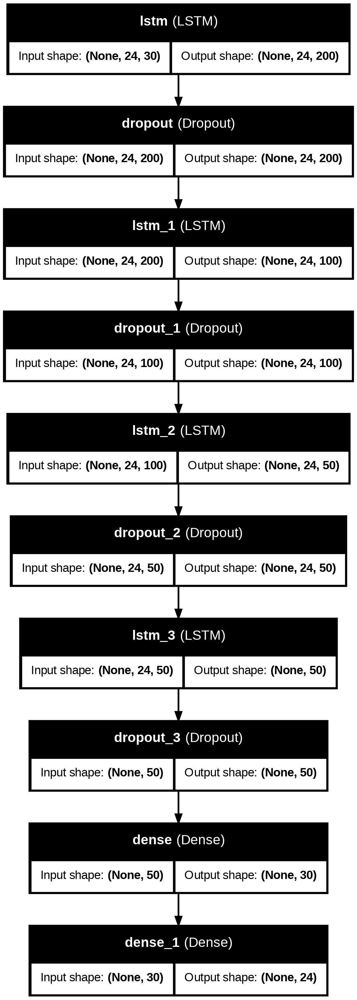

In [ ]:
#plot the model architecture
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  cabextract distro-info libfontenc1 libmspack0 python3-chardet
  python3-debconf python3-debian python3-distro-info python3-distupgrade
  python3-update-manager python3-yaml ubuntu-advantage-tools ubuntu-pro-client
  ubuntu-pro-client-l10n ubuntu-release-upgrader-core update-manager-core
  update-notifier-common xfonts-encodings xfonts-utils zstd
Suggested packages:
  shunit2
The following NEW packages will be installed:
  cabextract distro-info libfontenc1 libmspack0 python3-chardet
  python3-debconf python3-debian python3-distro-info python3-distupgrade
  python3-update-manager python3-yaml ttf-mscorefonts-installer


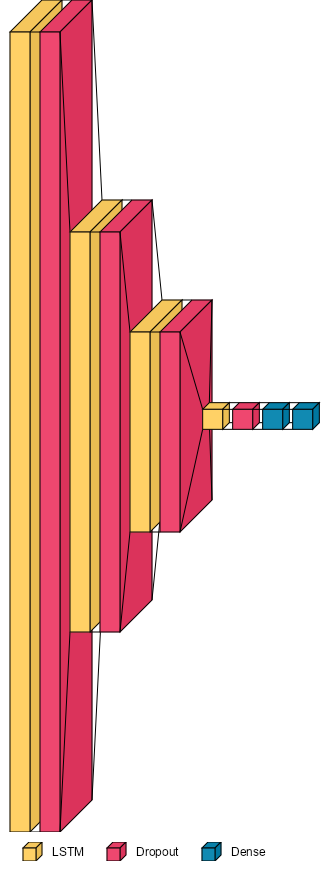

In [ ]:
!sudo apt install fonts-liberation
!sudo apt install ttf-mscorefonts-installer
!fc-cache -fv

from PIL import ImageFont
font = ImageFont.truetype("/usr/share/fonts/truetype/msttcorefonts/Arial.ttf", 12)

!pip install visualkeras
import visualkeras
visualkeras.layered_view(model, legend=True, font=font)


### Train Model

In [ ]:
# Set up the epochs, batch-size, callbacks

epochs = 100
batch_size =  64 #64 performs slightly better

callbacks = [tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=5,min_lr=0.0001),
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)]

In [ ]:
# do not run this if the model had been trained in the past, go to reload the model
history = model.fit(X_train_seq_tensor, y_train_seq_tensor, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=callbacks, verbose=1)

Epoch 1/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - loss: 0.0115 - mean_absolute_error: 0.0772 - val_loss: 0.0057 - val_mean_absolute_error: 0.0527 - learning_rate: 0.0010
Epoch 2/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0066 - mean_absolute_error: 0.0600 - val_loss: 0.0048 - val_mean_absolute_error: 0.0537 - learning_rate: 0.0010
Epoch 3/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0060 - mean_absolute_error: 0.0571 - val_loss: 0.0048 - val_mean_absolute_error: 0.0486 - learning_rate: 0.0010
Epoch 4/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0058 - mean_absolute_error: 0.0558 - val_loss: 0.0057 - val_mean_absolute_error: 0.0543 - learning_rate: 0.0010
Epoch 5/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0057 - mean_absolute_error: 0.0553 - val_loss: 0.0042 - val_mean_absolute_error: 0.0460 - learning_rate: 0.0010
Epoch 6/100
527/527 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 0.0055 - mean_absolute_error: 0.0541 - val_loss: 0.0042 - val_

### Visualize the Training & Validation Loss and MAE


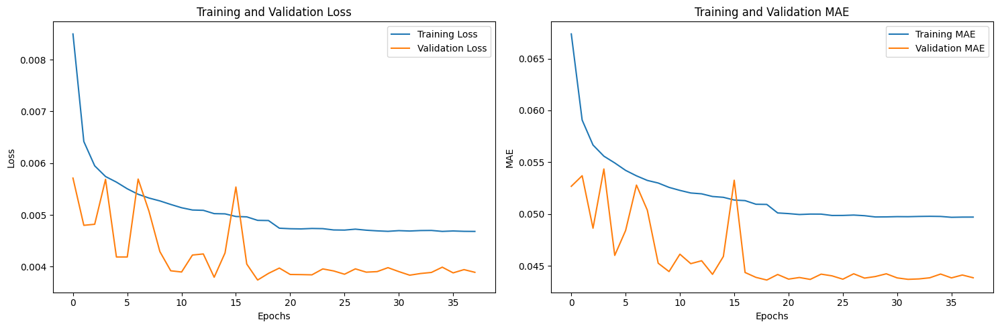

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15,5))

# Visualize the training and validation loss
axes[0].plot(history.history['loss'], label='Training Loss')
axes[0].plot(history.history['val_loss'], label='Validation Loss')
axes[0].set_title('Training and Validation Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Visualize the training and validation mae
axes[1].plot(history.history['mean_absolute_error'], label='Training MAE')
axes[1].plot(history.history['val_mean_absolute_error'], label='Validation MAE')
axes[1].set_title('Training and Validation MAE')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('MAE')
axes[1].legend()

plt.tight_layout()
plt.show()

### Save or Reload the Base Model

In [ ]:
# run this when retrain the model after changes of parameters, but do not run if revisiting model
from tensorflow import keras
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast12.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast24_timestep72.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast24_timestep48.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast18_timestep48.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast18_timestep36.keras')
#tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast12_timestep36.keras')
tf.keras.models.save_model(model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast12_timestep12.keras')

In [ ]:
# Load the saved LSTM model
#model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES_forecast18_timestep36.keras')
model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_MORE_FEATURES.keras')

# Verify the model's architecture or make predictions to check it's working
model.summary()  # Print the model summary to check the architecture

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 24, 200)             │         184,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 200)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 100)             │         120,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 24, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 24, 50)              │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 24, 50)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 30)                  │           1,530 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 24)                  │             744 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 715,754 (2.73 MB)

 Trainable params: 357,874 (1.37 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 357,880 (1.37 MB)

### Make Predictions from Base Model

In [ ]:
#make predictions
train_prediction = model.predict(X_train_seq_tensor, batch_size=batch_size)
test_prediction = model.predict(X_test_seq_tensor, batch_size=batch_size)
train_prediction.shape, test_prediction.shape, y_train_seq_tensor.shape, y_test_seq_tensor.shape

658/658 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


((42109, 24), (10493, 24), TensorShape([42109, 24]), TensorShape([10493, 24]))

In [ ]:
# Convert tensors to numpy if needed  # prior to adding kernel regularization
if isinstance(train_prediction, tf.Tensor):
  train_prediction = train_prediction.numpy()
if isinstance(test_prediction, tf.Tensor):
  test_prediction = test_prediction.numpy()
if isinstance(y_train_seq_tensor, tf.Tensor):
  y_train_seq_tensor = y_train_seq_tensor.numpy()
if isinstance(y_test_seq_tensor, tf.Tensor):
  y_test_seq_tensor = y_test_seq_tensor.numpy()

train_prediction.shape, test_prediction.shape, y_train_seq_tensor.shape, y_test_seq_tensor.shape

((42109, 24), (10493, 24), (42109, 24), (10493, 24))

In [ ]:
#rescale the actual y_test and prediction to original scale
train_prediction_rescaled = target_scaler.inverse_transform(train_prediction)
test_prediction_rescaled = target_scaler.inverse_transform(test_prediction)
y_train_original_rescaled = target_scaler.inverse_transform(y_train_seq_tensor)
y_test_original_rescaled = target_scaler.inverse_transform(y_test_seq_tensor)

In [ ]:
# compute rmse, mse, mae, r2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_test = mean_squared_error(y_test_original_rescaled[:,0], test_prediction_rescaled[:,0])
mae_test = mean_absolute_error(y_test_original_rescaled[:,0], test_prediction_rescaled[:,0])
r2_test = r2_score(y_test_original_rescaled[:,0], test_prediction_rescaled[:,0])

test_rmse = np.sqrt(mean_squared_error(y_test_original_rescaled[:,0], test_prediction_rescaled[:,0]))
train_rmse = np.sqrt(mean_squared_error(y_train_original_rescaled[:,0], train_prediction_rescaled[:,0]))
print(f"Train RMSE base: {train_rmse:.4f}")
print(f"Test RMSE base: {test_rmse:.4f}")
print(f"Test MSE base: {mse_test:.4f}")
print(f"Test MAE base: {mae_test:.4f}")
print(f"Test R2 base: {r2_test:.4f}")

Train RMSE base: 0.7535
Test RMSE base: 0.7746
Test MSE base: 0.5999
Test MAE base: 0.5839
Test R2 base: 0.6931


In [ ]:
# check values of original vs predicted in test data ==> use the one from [:,0] as these are the correct output.
print (f'y_test_original_rescaled[:,0] : {y_test_original_rescaled[:,0]}')
print (f'test_prediction_rescaled[:,0] : {test_prediction_rescaled[:,0]}')

y_test_original_rescaled[:,0] : [0.58000004 0.43       0.22       ... 1.5699999  1.6700001  1.47      ]
test_prediction_rescaled[:,0] : [0.23125102 0.21837634 0.20849915 ... 1.3545153  1.2992231  1.2566614 ]


In [ ]:
def plot_prediction_metrics(y_true_2d, y_pred_2d, forecast_steps, model_label):
    """
    Plots R², MAE, RMSE, MAPE, and SMAPE for each forecast step.

    Parameters:
    - y_true_2d: np.array, shape (samples, forecast_steps)
    - y_pred_2d: np.array, shape (samples, forecast_steps)
    - forecast_steps: int, number of forecast steps (e.g., 12)
    - model_label: str, optional label for the model (used in titles)
    """
    # Initialize storage
    r2_list, mae_list, rmse_list, smape_list, mape_list = [], [], [], [], []
    epsilon = 1e-8  # To avoid divide-by-zero

    for i in range(forecast_steps):
        y_true = y_true_2d[:, i]
        y_pred = y_pred_2d[:, i]

        r2_list.append(r2_score(y_true, y_pred))
        mae_list.append(mean_absolute_error(y_true, y_pred))
        rmse_list.append(np.sqrt(mean_squared_error(y_true, y_pred)))

        smape = np.mean(2 * np.abs(y_true - y_pred) / (np.abs(y_true) + np.abs(y_pred) + epsilon)) * 100
        smape_list.append(smape)

        mape = np.mean(np.abs((y_true - y_pred) / (y_true + epsilon))) * 100
        mape_list.append(mape)

    # Plotting
    steps = np.arange(1, forecast_steps + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(steps, r2_list, marker='o', color='tab:blue')
    plt.axhline(0, color='gray', linestyle='--', alpha=0.7)
    plt.title(f'R² Score per Forecast Step\n({model_label})')
    plt.xlabel('Forecast Step')
    plt.ylabel('R²')
    plt.grid(True)

    plt.subplot(2, 2, 2)
    plt.plot(steps, mae_list, marker='o', color='tab:orange')
    plt.title(f'MAE per Forecast Step\n({model_label})')
    plt.xlabel('Forecast Step')
    plt.ylabel('Mean Absolute Error')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(steps, rmse_list, marker='o', color='tab:green')
    plt.title(f'RMSE per Forecast Step\n({model_label})')
    plt.xlabel('Forecast Step')
    plt.ylabel('Root Mean Squared Error')
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(steps, mape_list, marker='o', color='tab:green', label='MAPE')
    plt.plot(steps, smape_list, marker='o', color='tab:red', label='SMAPE')
    plt.title(f'MAPE and SMAPE per Forecast Step\n({model_label})')
    plt.xlabel('Forecast Step')
    plt.ylabel('Percentage Error (%)')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


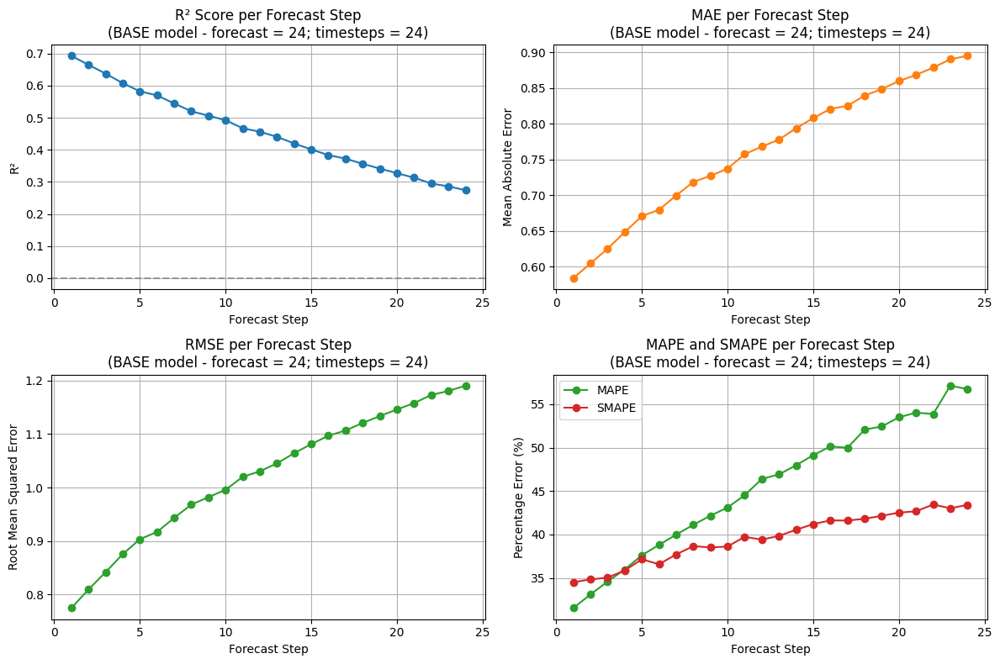

In [ ]:
# plot the metrics for BASE model
plot_prediction_metrics(y_test_original_rescaled, test_prediction_rescaled, forecast_steps, 'BASE model - forecast = 24; timesteps = 24')

In [ ]:
# function to plot the actual and predicted target variable
def plot_prediction_comparison(y_true, y_pred, xlims=None, ylim=None, title="Test Data - Actual vs. Predicted", xlabel="Time", ylabel="Target Variable"):
    """
    Plots actual vs predicted values over given x-ranges.

    Args:
        y_true (ndarray): Ground truth values (2D array).
        y_pred (ndarray): Predicted values (2D array).
        xlims (list of tuples): List of x-axis ranges to plot [(start1, end1), (start2, end2), ...].
        ylim (tuple): Optional y-axis limit (ymin, ymax).
        title (str): Plot title.
        xlabel (str): Label for x-axis.
        ylabel (str): Label for y-axis.
    """
    if xlims is None:
        xlims = [(0, len(y_true))]  # Plot the whole range if none provided

    for i, (start, end) in enumerate(xlims):
        x_range = range(start, end)
        plt.figure(figsize=(20, 6))
        plt.plot(x_range, y_true[start:end, 0], label='Test - Actual', lw=1.5)
        plt.plot(x_range, y_pred[start:end, 0], label='Test - Predicted', ls='--')
        if ylim:
            plt.ylim(ylim)
        plt.xlim(start, end)
        plt.title(f"{title} (Slice {i+1}: {start}–{end})")
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend()
        plt.show()

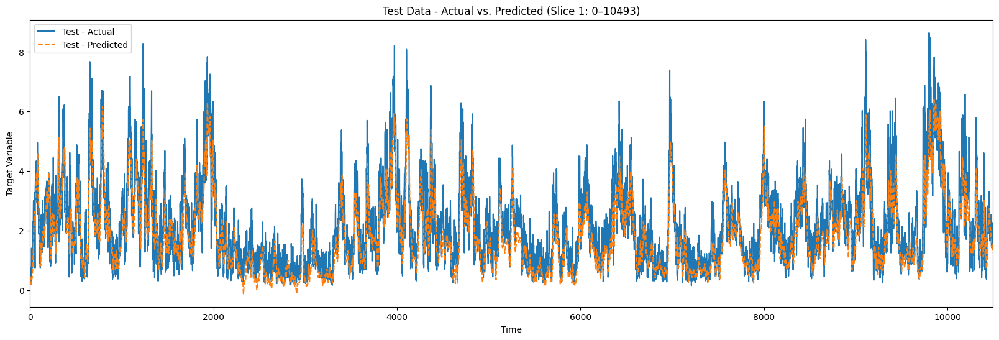

In [ ]:
# plot all test data - BASE model
plot_prediction_comparison(y_test_original_rescaled, test_prediction_rescaled, xlims=None, ylim=None, title="Test Data - Actual vs. Predicted", xlabel="Time", ylabel="Target Variable")

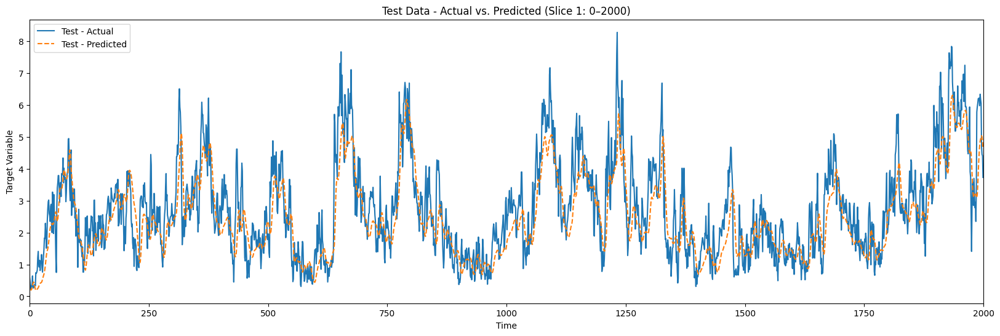

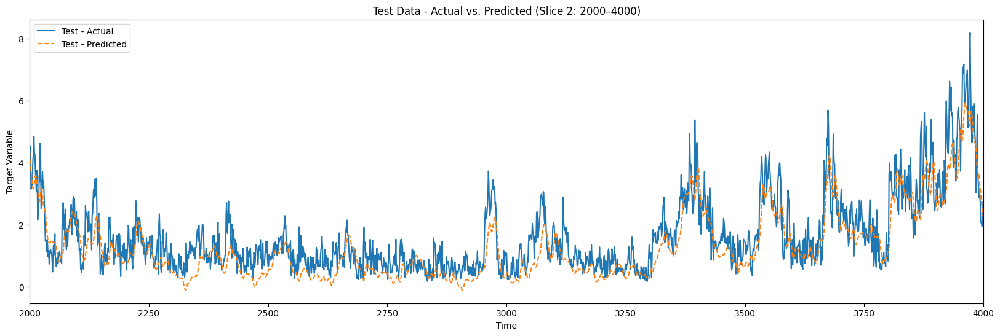

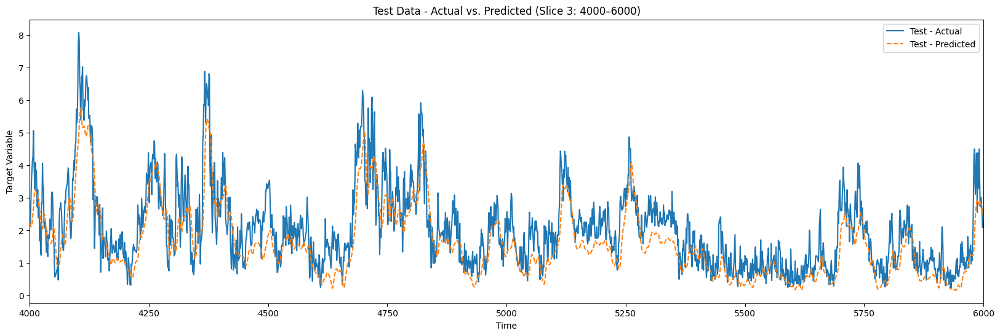

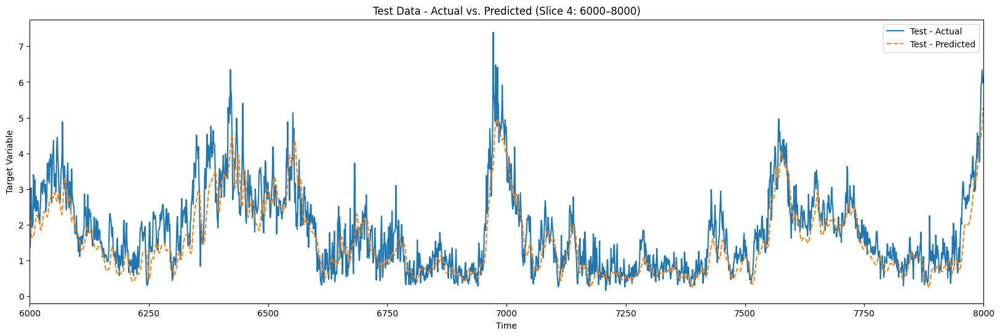

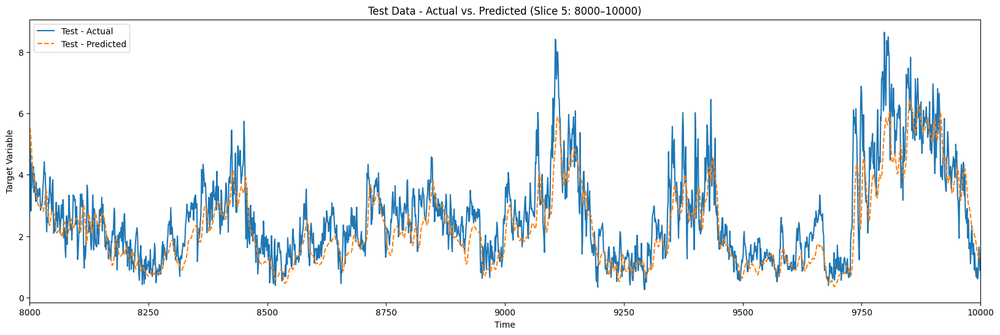

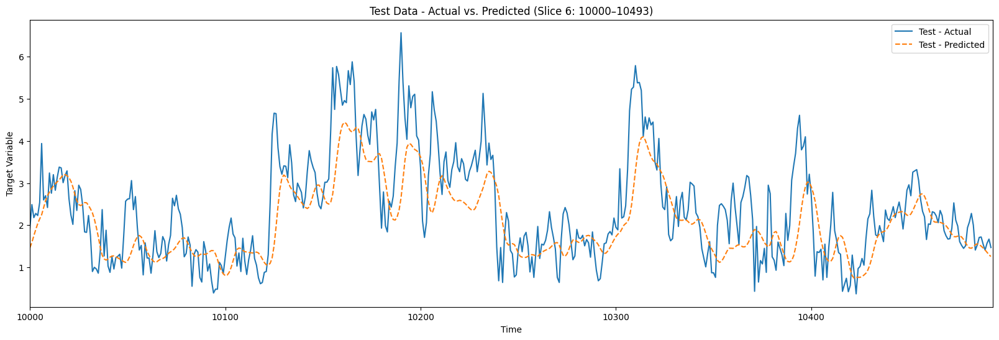

In [ ]:
# plot expanding test data - BASE model
x_ranges = [(0, 2000), (2000, 4000), (4000,6000), (6000,8000), (8000, 10000), (10000, len(y_test_original_rescaled))]
plot_prediction_comparison(y_test_original_rescaled, test_prediction_rescaled, xlims=x_ranges,ylim=None, title="Test Data - Actual vs. Predicted", xlabel="Time", ylabel="Target Variable")

### Keras Tuner

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.8 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt

In [ ]:
# Define model-building function with hyperparameter tuning
def build_model(hp):
    model = Sequential()

    #tune number of neurons
    lstm_unit1= hp.Int('lstm_unit1', min_value=150, max_value=250, step=50)  # 3 CHOICES
    model.add(LSTM(units=lstm_unit1, return_sequences=True, input_shape=input_shape, dtype='float32'))

    #tune dropout rate
    dropout_rate = hp.Choice('dropout_rate', [0.2, 0.3, 0.4]) # 3 CHOICES
    model.add(Dropout(dropout_rate))

    #lstm layer 2's unit depends on lstm unit 1
    lstm_unit2= lstm_unit1 - 50
    model.add(LSTM(units=lstm_unit2, return_sequences=True, dtype='float32'))
    model.add(Dropout(dropout_rate))

    #LSTM layer 3 and dropout layer
    lstm_unit3 = lstm_unit2 - 50
    model.add(LSTM(units=lstm_unit3, return_sequences=True, dtype='float32'))
    model.add(Dropout(dropout_rate))

    #LSTM layer 4 and dropout layer
    model.add(LSTM(units=LSTM_units_4, return_sequences=False, dtype='float32'))
    model.add(Dropout(dropout_rate))

    #Dense output layer
    dense_units_1 = hp.Choice('dense_units_1', [30,40]) # 2 choices
    model.add(Dense(units=dense_units_1, dtype='float32'))
    model.add(Dense(units=forecast_steps, activation= dense_activation, dtype='float32'))

    #tune learning rate
    #learning_rate = hp.Choice('learning_rate', [0.0001, 0.001]) # 0.01 performs worse
    optimizer_adam= Adam(learning_rate=0.001)
    optimizer_rmsprop = RMSprop(learning_rate=0.001)

    # Compile the model
    model.compile(optimizer=optimizer_rmsprop, loss='mean_squared_error', metrics=['mean_absolute_error'])

    return model

In [ ]:
# Instantiate Keras Tuner with Random Search
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=18,
    executions_per_trial=1,
    directory='my_tuning_dir_9', # change this when rerun
    project_name='regression_tuning'
)

In [ ]:
# Run the tuner
callbacks_tuner = [tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=5,min_lr=0.00001),
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
#callbacks=[EarlyStopping(monitor='val_loss', patience=10), ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=5,min_lr=0.0001)]
tuner.search(X_train_seq_tensor, y_train_seq_tensor, epochs=50, validation_split=0.2, callbacks = callbacks_tuner)
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Best Hyperparameters: {best_hps.values}")

Trial 17 Complete [00h 05m 08s]
val_loss: 0.004993859678506851

Best val_loss So Far: 0.004828751552850008
Total elapsed time: 01h 02m 23s
Best Hyperparameters: {'lstm_unit1': 250, 'dropout_rate': 0.2, 'dense_units_1': 30}


### Rerun Model with Optimized Hyperparameters

In [ ]:
input_shape = (time_steps, X_train_seq.shape[2])
output_length = forecast_steps
LSTM_units_1_opt = 250
LSTM_units_2_opt = 200
LSTM_units_3_opt = 150
LSTM_units_4 = 50
dropout_rate_opt = 0.2
dense_units_1_opt = 30
lstm_activation = 'relu' #only called if need to change from default tanh, tested with 'relu' outcome is worse than tanh
dense_activation = 'linear' # only called if need to change from default (No activation)
learning_rate_opt = 0.001

In [ ]:
# Define model-function with optimized hyperparameter
def opt_model(input_shape, LSTM_units_1_opt, LSTM_units_2_opt, LSTM_units_3_opt, LSTM_units_4, dropout_rate_opt, dense_units_1_opt, dense_activation):
    model = Sequential()
    model.add(LSTM(units=LSTM_units_1_opt, return_sequences=True, input_shape=input_shape, dtype='float32'))
    model.add(Dropout(dropout_rate_opt))
    model.add(LSTM(units=LSTM_units_2_opt, return_sequences=True, dtype='float32'))
    model.add(Dropout(dropout_rate_opt))
    model.add(LSTM(units=LSTM_units_3_opt, return_sequences=True, dtype='float32'))
    model.add(Dropout(dropout_rate_opt))
    model.add(LSTM(units=LSTM_units_4, return_sequences=False, dtype='float32'))
    model.add(Dropout(dropout_rate_opt))
    #model.add(LSTM(units=LSTM_units_5, return_sequences=False, dtype='float32')) # 5 LSTM layers didn't perform better than 4
    #model.add(Dropout(dropout_rate_opt))
    model.add(Dense(units=dense_units_1_opt, dtype='float32'))
    model.add(Dense(units=forecast_steps, activation= dense_activation, dtype='float32'))

    optimizer_rmsprop = RMSprop(learning_rate=learning_rate_opt)
    optimizer_adam = Adam(learning_rate=learning_rate_opt)  # worse than RMSprop
    model.compile(optimizer=optimizer_rmsprop, loss='mean_squared_error', metrics=['mean_absolute_error'])

    return model

In [ ]:
epochs = 100
batch_size =  64 #32 and 64 are ok

callbacks = [tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=5,min_lr=0.00001),
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)]

In [ ]:
#fit the model , do not run if this had been fitted, go to reload the best model instead
%%time

best_model = opt_model(input_shape, LSTM_units_1_opt, LSTM_units_2_opt, LSTM_units_3_opt,LSTM_units_4,dropout_rate_opt,dense_units_1_opt, dense_activation)
best_model_history = best_model.fit(X_train_seq_tensor, y_train_seq_tensor, epochs=epochs, batch_size=batch_size, validation_split=0.2, callbacks=callbacks, verbose=1)

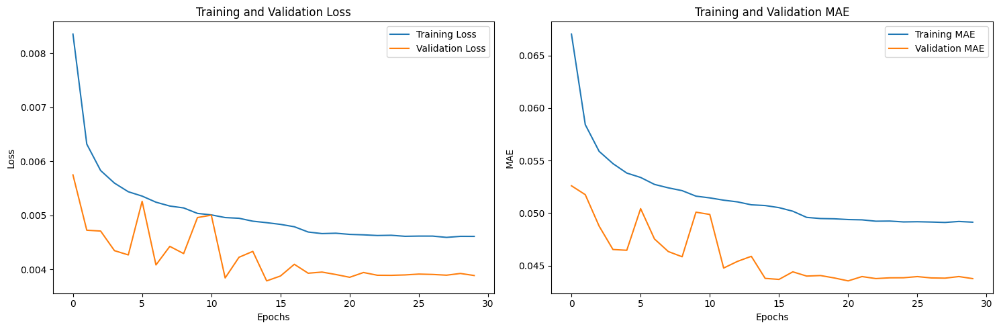

In [ ]:
#visualisation of the best model metrics

fig, axes = plt.subplots(1, 2, figsize=(15,5))

# Visualize the training and validation loss

axes[0].plot(best_model_history.history['loss'], label='Training Loss')
axes[0].plot(best_model_history.history['val_loss'], label='Validation Loss')
axes[0].set_title('Training and Validation Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Visualize the training and validation mae
axes[1].plot(best_model_history.history['mean_absolute_error'], label='Training MAE')
axes[1].plot(best_model_history.history['val_mean_absolute_error'], label='Validation MAE')
axes[1].set_title('Training and Validation MAE')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('MAE')
axes[1].legend()

plt.tight_layout()
plt.show()

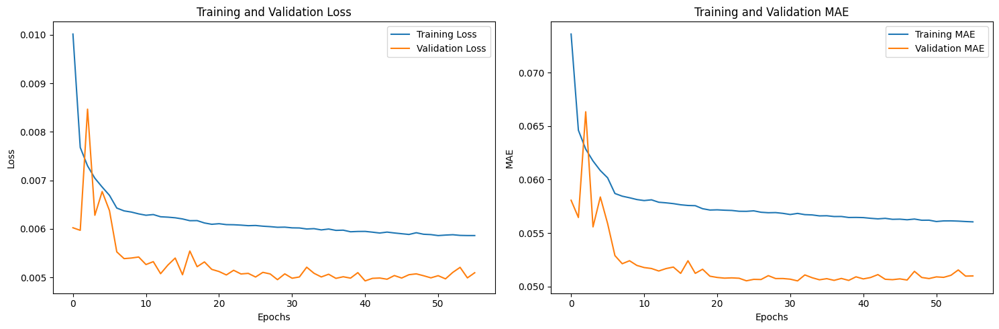

In [ ]:
# plots from previous best models with less features

### Save or Reload the Best Model

In [ ]:
# run this when retrain the model after changes of optimal parameters, but do not run if revisiting model
from tensorflow import keras
#tf.keras.models.save_model(best_model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features.keras')
#tf.keras.models.save_model(best_model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features_forecast12.keras')
#tf.keras.models.save_model(best_model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features_forecast18_timestep36.keras')
tf.keras.models.save_model(best_model,'/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features_forecast12_timestep12.keras')

In [ ]:
# Load the saved LSTM model
#best_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features.keras') #timestep 24 forecast 24
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features_forecast12_timestep12.keras')
#best_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/lstm_rerun_best_more_features_forecast12.keras') #timestep 24 forecast 12

# Verify the model's architecture or make predictions to check it's working
best_model.summary()  # Print the model summary to check the architecture

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, 12, 250)             │         281,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 12, 250)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 12, 200)             │         360,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 12, 200)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 12, 150)             │         210,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 12, 150)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 50)                  │          40,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 30)                  │           1,530 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 12)                  │             372 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,789,006 (6.82 MB)

 Trainable params: 894,502 (3.41 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 894,504 (3.41 MB)

### Make Predictions with Best Model

In [ ]:
# create prediction with best model

train_prediction_bestmodel = best_model.predict(X_train_seq_tensor, batch_size=batch_size)
test_prediction_bestmodel = best_model.predict(X_test_seq_tensor, batch_size=batch_size)
train_prediction_bestmodel.shape, test_prediction_bestmodel.shape, y_train_seq_tensor.shape, y_test_seq_tensor.shape

659/659 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
165/165 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


((42133, 12), (10517, 12), TensorShape([42133, 12]), TensorShape([10517, 12]))

In [ ]:
# Convert tensors to numpy if needed
if isinstance(train_prediction_bestmodel, tf.Tensor):
  train_prediction_bestmodel = train_prediction_bestmodel.numpy()
if isinstance(test_prediction_bestmodel, tf.Tensor):
  test_prediction_bestmodel = test_prediction_bestmodel.numpy()
if isinstance(y_train_seq_tensor, tf.Tensor):
  y_train_seq_tensor = y_train_seq_tensor.numpy()
if isinstance(y_test_seq_tensor, tf.Tensor):
  y_test_seq_tensor = y_test_seq_tensor.numpy()

train_prediction_bestmodel.shape, test_prediction_bestmodel.shape, y_train_seq_tensor.shape, y_test_seq_tensor.shape

((42133, 12), (10517, 12), (42133, 12), (10517, 12))

In [ ]:
#rescale the actual y_test and prediction to original scale
train_prediction_bestmodel_rescaled = target_scaler.inverse_transform(train_prediction_bestmodel)
test_prediction_bestmodel_rescaled = target_scaler.inverse_transform(test_prediction_bestmodel)
y_train_original_rescaled = target_scaler.inverse_transform(y_train_seq_tensor)
y_test_original_rescaled = target_scaler.inverse_transform(y_test_seq_tensor)

In [ ]:
# compute rmse, mse, mae, r2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_test_bestmodel = mean_squared_error(y_test_original_rescaled[:,0], test_prediction_bestmodel_rescaled[:,0])
mae_test_bestmodel = mean_absolute_error(y_test_original_rescaled[:,0], test_prediction_bestmodel_rescaled[:,0])
r2_test_bestmodel = r2_score(y_test_original_rescaled[:,0], test_prediction_bestmodel_rescaled[:,0])

test_rmse_bestmodel = np.sqrt(mean_squared_error(y_test_original_rescaled[:,0], test_prediction_bestmodel_rescaled[:,0]))
train_rmse_bestmodel = np.sqrt(mean_squared_error(y_train_original_rescaled[:,0], train_prediction_bestmodel_rescaled[:,0]))
print(f"Train RMSE best model: {train_rmse_bestmodel:.4f}")
print(f"Test RMSE best model: {test_rmse_bestmodel:.4f}")
print(f"Test MSE best model: {mse_test_bestmodel:.4f}")
print(f"Test MAE best model: {mae_test_bestmodel:.4f}")
print(f"Test R2 best model: {r2_test_bestmodel:.4f}")

Train RMSE best model: 0.6723
Test RMSE best model: 0.6205
Test MSE best model: 0.3850
Test MAE best model: 0.4671
Test R2 best model: 0.8031


In [ ]:
# rmse, mse, mae, r2 from optimized model with timesteps = 24, forecast steps = 12

Train RMSE best model: 0.6541
Test RMSE best model: 0.6429
Test MSE best model: 0.4134
Test MAE best model: 0.4812
Test R2 best model: 0.7884


In [ ]:
# rmse, mse, mae, r2 from optimized model with timesteps = 12, forecast steps = 12

Train RMSE best model: 0.6723
Test RMSE best model: 0.6205
Test MSE best model: 0.3850
Test MAE best model: 0.4671
Test R2 best model: 0.8031


In [ ]:
# rmse, mse, mae, r2 from optimized model with timesteps = 24, forecast steps = 24

Train RMSE best model: 0.7104
Test RMSE best model: 0.7274
Test MSE best model: 0.5290
Test MAE best model: 0.5541
Test R2 best model: 0.7294


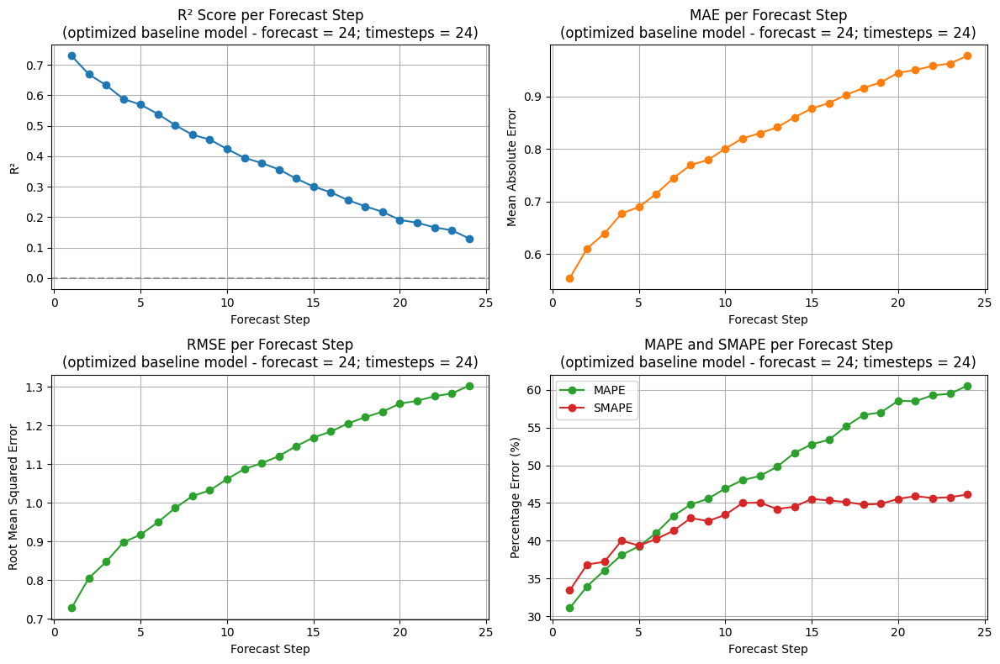

In [ ]:
# plot the metrics for optimized baseline model
plot_prediction_metrics(y_test_original_rescaled, test_prediction_bestmodel_rescaled, forecast_steps, 'optimized baseline model - forecast = 24; timesteps = 24')

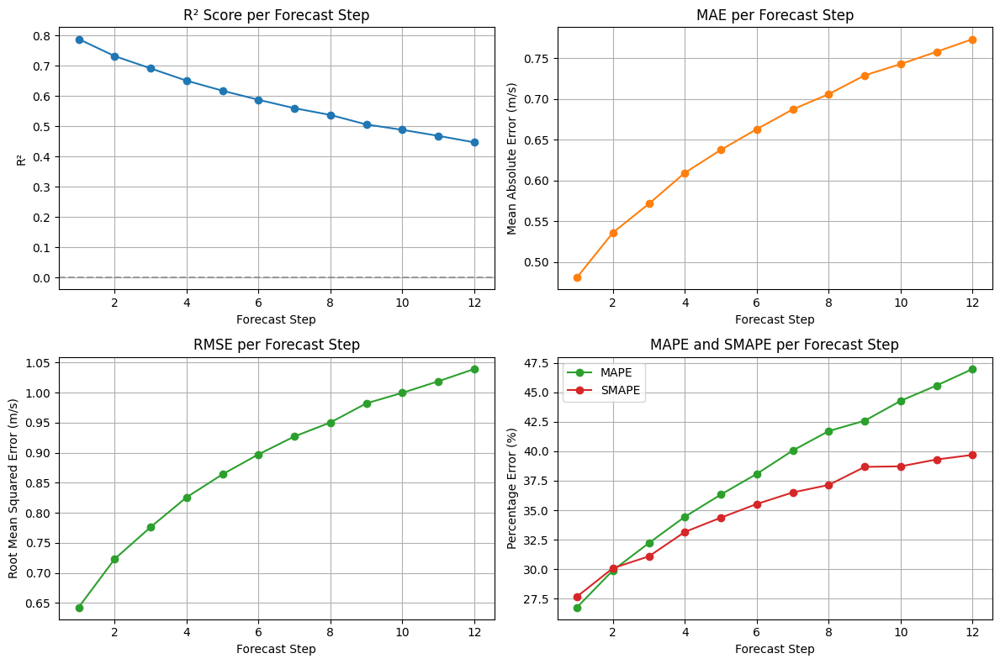

In [ ]:
# metrics plot from optimized model with timesteps = 24, forecast steps = 12

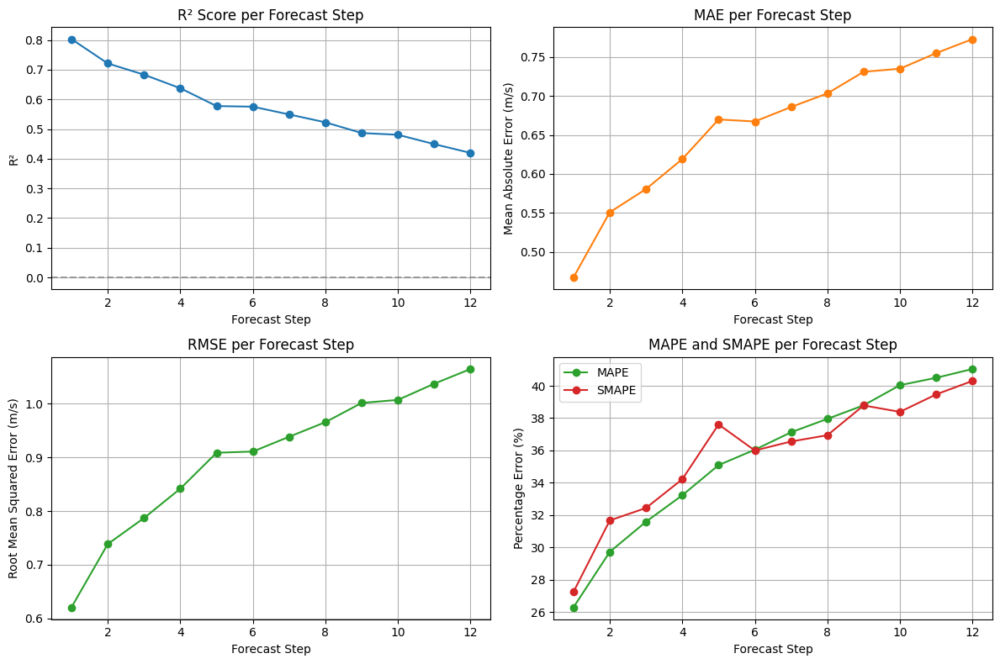

In [ ]:
# metrics plot from optimized model with timesteps = 12, forecast steps = 12

In [ ]:
# Create residuals for each forecast step
residuals_per_step = {
    f"Step {i+1}": y_test_original_rescaled[:, i] - test_prediction_bestmodel_rescaled[:, i]
    for i in range(forecast_steps)
}

# Convert to DataFrame for plotting
residuals_df = pd.DataFrame(residuals_per_step)

# Melt for seaborn boxplot
residuals_melted = residuals_df.melt(var_name='Forecast Step', value_name='Residual')

# Plot
plt.figure(figsize=(8, 5))
sns.boxplot(data=residuals_melted, x='Forecast Step', y='Residual')
#sns.violinplot(data=residuals_melted, x='Forecast Step', y='Residual', inner='box')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Residuals Distribution by Forecast Step')
plt.ylabel('Residual (Actual - Predicted)')
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

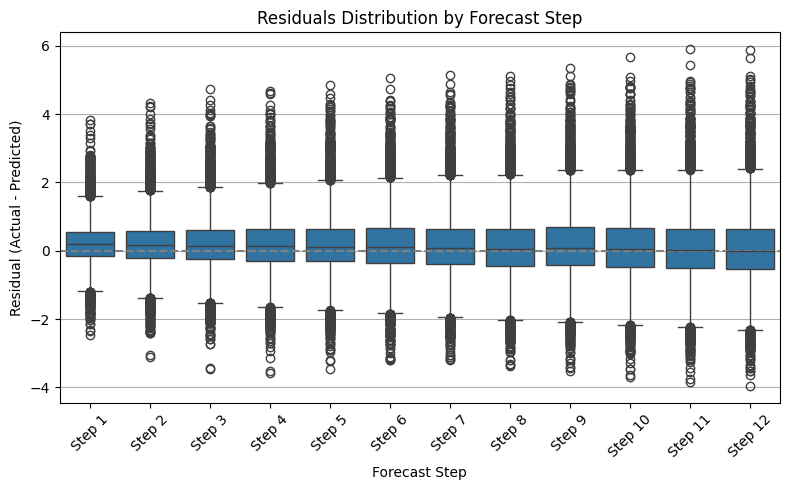

In [ ]:
# residual distribution from optimized model with timesteps = 24, forecast steps = 12

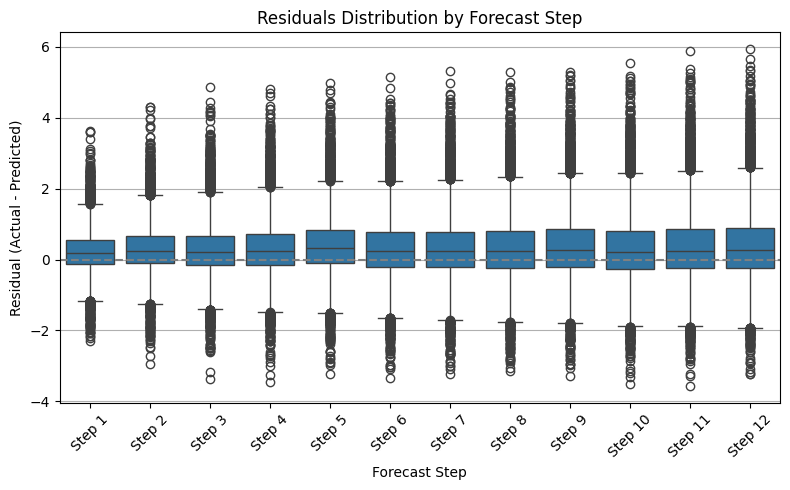

In [ ]:
# residual distribution from optimized model with timesteps = 12, forecast steps = 12

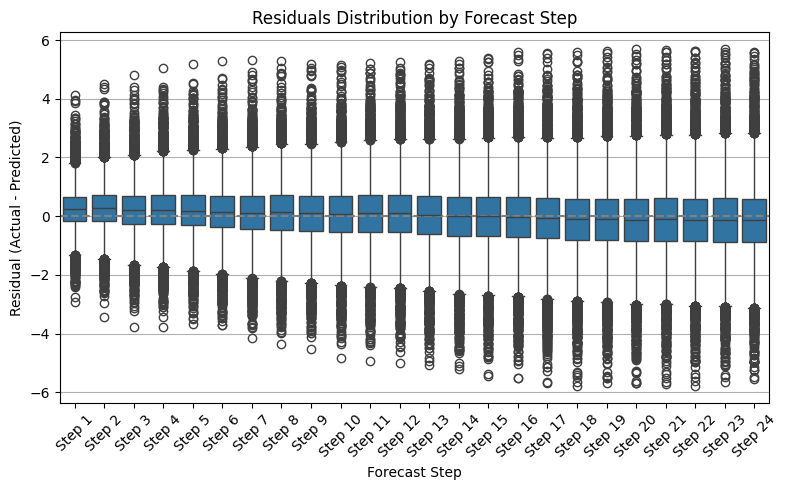

In [ ]:
# residual distribution from optimized model with timesteps = 24, forecast steps = 24

In [ ]:
# check values of original vs predicted in test data ==> use the one from [:,0] as these are the correct values.
print (f'y_test_original_rescaled[:,0] : {y_test_original_rescaled[:,0]}')
print (f'test_prediction_bestmodel_rescaled[:,0] : {test_prediction_bestmodel_rescaled[:,0]}')

print(f'y_train_original_rescaled[:,0] : {y_train_original_rescaled[:,0]}')
print (f'train_prediction_bestmodel_rescaled[:,0] : {train_prediction_bestmodel_rescaled[:,0]}')

y_test_original_rescaled[:,0] : [0.58000004 0.43       0.22       ... 1.5699999  1.6700001  1.47      ]
test_prediction_bestmodel_rescaled[:,0] : [0.22178555 0.21615984 0.21483046 ... 1.2302887  1.166786   1.1273565 ]
y_train_original_rescaled[:,0] : [1.1600001 0.47      0.81      ... 2.29      2.1       2.52     ]
train_prediction_bestmodel_rescaled[:,0] : [0.79176486 0.8251631  0.7926733  ... 1.940833   2.0401614  2.0641212 ]


In [ ]:
def plot_prediction_diagnostics(y_true, y_pred, bins=[0, 2, 4, 6, 8, 10, 20]):
    residuals = y_true - y_pred
    mbe = np.mean(residuals)

    # MAPE and SMAPE and percentage error (avoid divide-by-zero)
    perc_error = 100 * (np.abs(y_true - y_pred) / (np.abs(y_true) + 1e-8))
    mape = np.mean(perc_error)

    sperc_error = 100 * (2 * np.abs(y_true - y_pred) / (np.abs(y_true) + np.abs(y_pred) + 1e-8))
    smape = np.mean(sperc_error)

    bin_df = pd.DataFrame({
        'actual': y_true,
        'predicted': y_pred,
        'residual': residuals,
        'perc_error': perc_error,
        'sperc_error': sperc_error
    })
    bin_df['bin'] = pd.cut(bin_df['actual'], bins=bins)

    grouped = bin_df.groupby('bin').agg({
        'residual': ['mean', 'std'],
        'actual': 'count'
    })
    grouped.columns = ['residual_mean', 'residual_std', 'actual_count']

    # MAPE and SMAPE grouped by bin
    mape_grouped = bin_df.groupby('bin').agg(
        mape_mean=('perc_error', 'mean'),
        mape_std=('perc_error', 'std'),
        count=('actual', 'count')
    )

    smape_grouped = bin_df.groupby('bin').agg(
        smape_mean=('sperc_error', 'mean'),
        smape_std=('sperc_error', 'std')
    )

    bin_labels = grouped.index.astype(str)
    x = np.arange(len(bin_labels))

    fig, axs = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle("Wind Speed Prediction Diagnostic Dashboard", fontsize=16)

    # --- Plot 1: Residuals vs Actual with MBE box ---
    sns.scatterplot(x=bin_df['actual'], y=bin_df['residual'], ax=axs[0, 0], alpha=0.4)
    axs[0, 0].axhline(0, color='gray', linestyle='--')
    axs[0, 0].set_title("Residuals vs Actual Wind Speed")
    axs[0, 0].set_xlabel("Actual Wind Speed (m/s)")
    axs[0, 0].set_ylabel("Residual (Actual - Predicted)")
    axs[0, 0].text(0.95, 0.95, f"MBE = {mbe:.2f} m/s",
                   transform=axs[0, 0].transAxes,
                   fontsize=10, verticalalignment='top', horizontalalignment='right',
                   bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    # --- Plot 2: Predicted vs Actual ---
    sns.scatterplot(x=bin_df['actual'], y=bin_df['predicted'], ax=axs[0, 1], alpha=0.4)
    axs[0, 1].plot([0, max(y_true)], [0, max(y_true)], 'r--', label='Perfect Prediction')
    axs[0, 1].set_title("Predicted vs Actual Wind Speed")
    axs[0, 1].set_xlabel("Actual Wind Speed (m/s)")
    axs[0, 1].set_ylabel("Predicted Wind Speed (m/s)")
    axs[0, 1].legend()

    # --- Plot 3: Binned residuals + sample count ---
    ax1 = axs[1, 0]
    ax2 = ax1.twinx()

    ax1.plot(x, grouped['residual_mean'], marker='o', color='tab:blue', label='Mean Residual')
    ax1.fill_between(x,
                     grouped['residual_mean'] - grouped['residual_std'],
                     grouped['residual_mean'] + grouped['residual_std'],
                     alpha=0.2, color='tab:blue', label='±1 Std Dev')
    ax1.axhline(0, color='gray', linestyle='--')
    ax1.set_ylabel("Residual (m/s)", color='tab:blue')
    ax1.set_xlabel("Wind Speed Bin")
    ax1.set_xticks(x)
    ax1.set_xticklabels(bin_labels, rotation=45)
    ax1.set_title("Residual Trend Across Wind Speed Bins")

    ax2.bar(x, grouped['actual_count'], alpha=0.3, color='tab:orange', label='Sample Count')
    ax2.set_ylabel("Sample Count", color='tab:orange')

    for i, val in enumerate(grouped['residual_mean']):
        ax1.text(x[i], val + 0.1, f'{val:.2f}', ha='center', va='bottom', fontsize=8, color='tab:blue')

    # --- Plot 4: MAPE across bins ---
    ax3 = axs[1, 1]
    ax4 = ax3.twinx()

    ax3.plot(x, mape_grouped['mape_mean'], marker='o', color='tab:green', label='Mean MAPE')
    ax3.fill_between(x,
                     mape_grouped['mape_mean'] - mape_grouped['mape_std'],
                     mape_grouped['mape_mean'] + mape_grouped['mape_std'],
                     alpha=0.2, color='tab:green')

    ax3.plot(x, smape_grouped['smape_mean'], marker='o', color='tab:red', label='Mean SMAPE')
    ax3.fill_between(x,
                     smape_grouped['smape_mean'] - smape_grouped['smape_std'],
                     smape_grouped['smape_mean'] + smape_grouped['smape_std'],
                     alpha=0.2, color='tab:red')

    ax3.axhline(0, color='gray', linestyle='--')
    ax3.set_ylabel("Percentage Error (%)", color='black')
    ax3.set_xlabel("Wind Speed Bin")
    ax3.set_xticks(x)
    ax3.set_xticklabels(bin_labels, rotation=45)
    ax3.set_title("MAPE and SMAPE Trend Across Wind Speed Bins")

    ax4.bar(x, mape_grouped['count'], alpha=0.3, color='tab:orange')
    ax4.set_ylabel("Sample Count", color='tab:orange')

    for i, val in enumerate(mape_grouped['mape_mean']):
        ax3.text(x[i], val + 1, f'{val:.1f}', ha='center', va='bottom', fontsize=8, color='tab:green')
    for i, val in enumerate(smape_grouped['smape_mean']):
        ax3.text(x[i], val - 6, f'{val:.1f}', ha='center', va='top', fontsize=8, color='tab:red')

    fig.legend(loc='lower center', bbox_to_anchor=(0.5, -0.02), ncol=4)
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.subplots_adjust(wspace=0.2, hspace=0.35)
    plt.show()

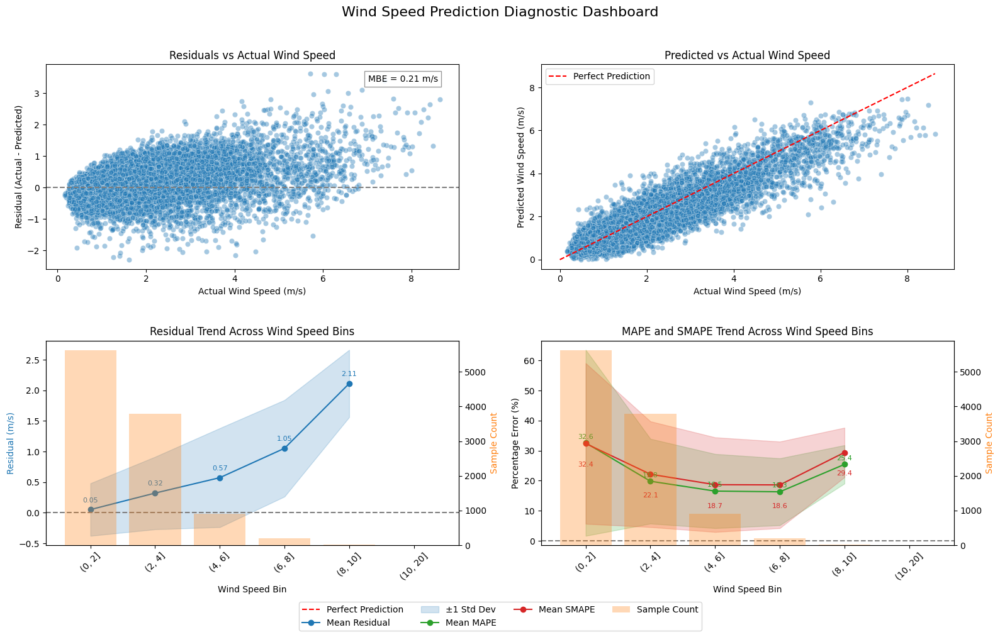

In [ ]:
# metrics from forecast 12 timesteps 12 - optimized best model
#plot_prediction_diagnostics(y_test_original_rescaled[:, 0], test_prediction_bestmodel_rescaled[:, 0], bins=[0, 2, 4, 6, 8, 10, 20])

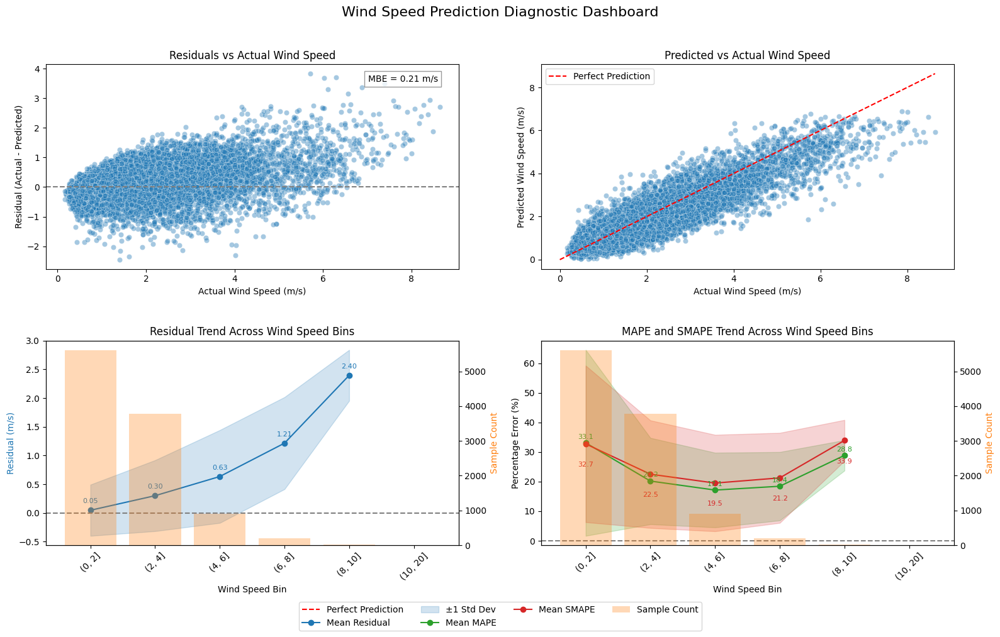

In [ ]:
# metrics from forecast 12 timesteps 24 - optimized 'mid' model
#plot_prediction_diagnostics(y_test_original_rescaled[:, 0], test_prediction_bestmodel_rescaled[:, 0], bins=[0, 2, 4, 6, 8, 10, 20])

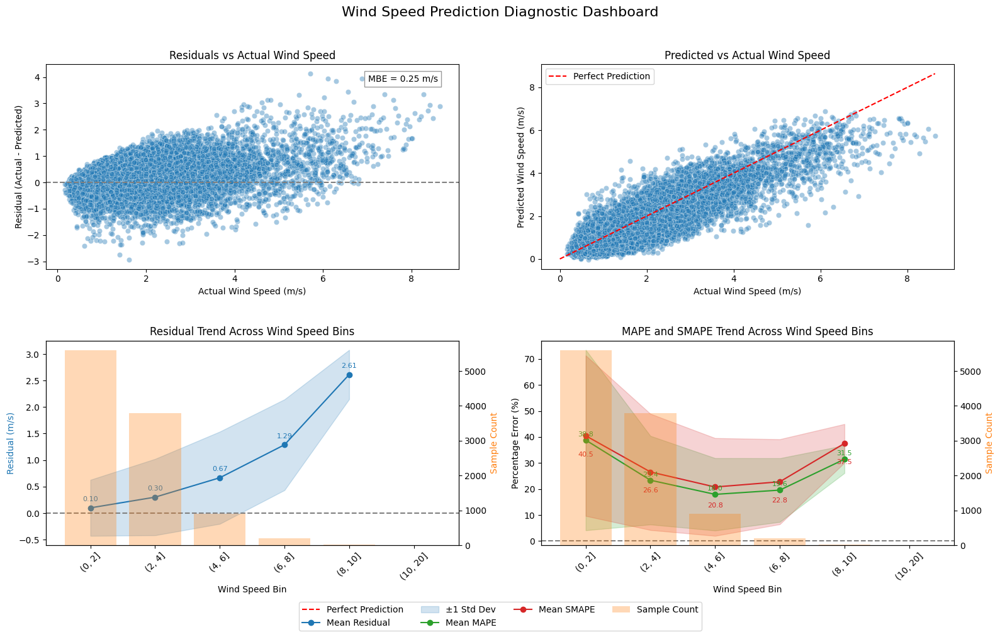

In [ ]:
# metrics from forecast 24 timesteps 24 - optimized baseline model
#plot_prediction_diagnostics(y_test_original_rescaled[:, 0], test_prediction_bestmodel_rescaled[:, 0], bins=[0, 2, 4, 6, 8, 10, 20])

**Plots from optimized best model (timesteps = 12, forecast steps =12)**

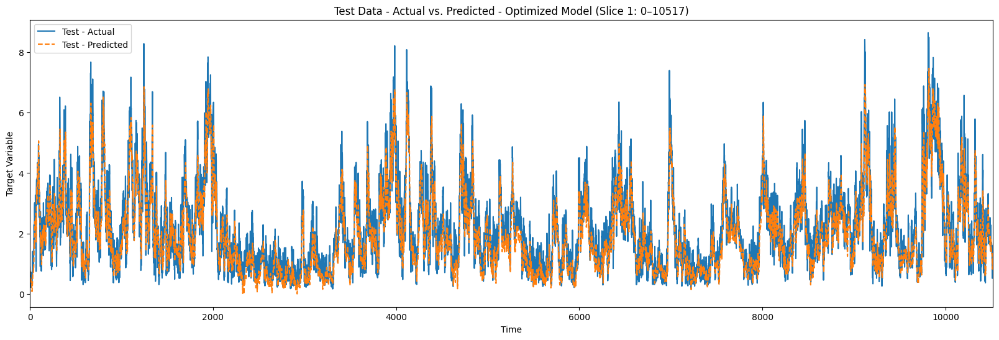

In [ ]:
# plot all test data  from forecast 12 timesteps 12
plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=None, ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

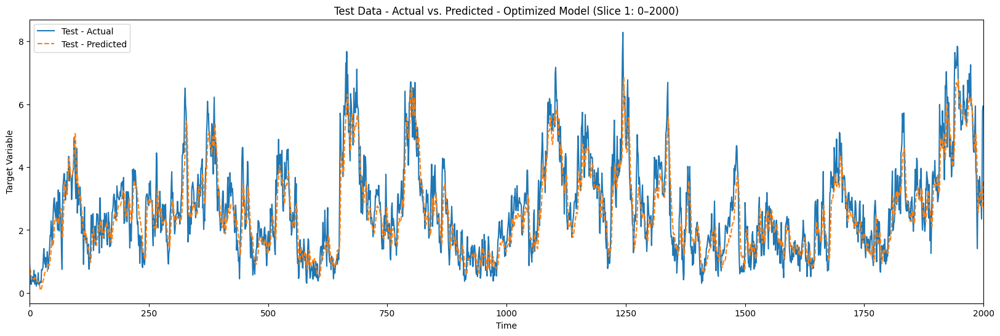

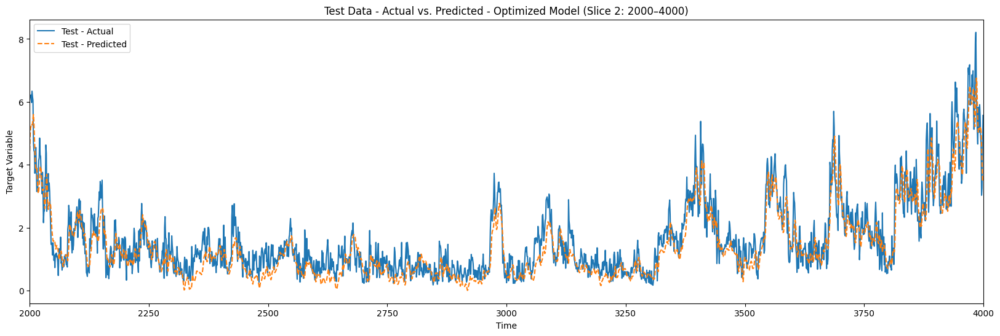

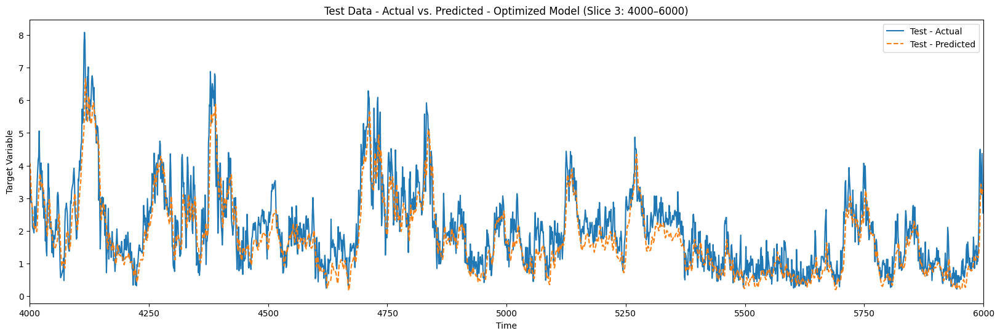

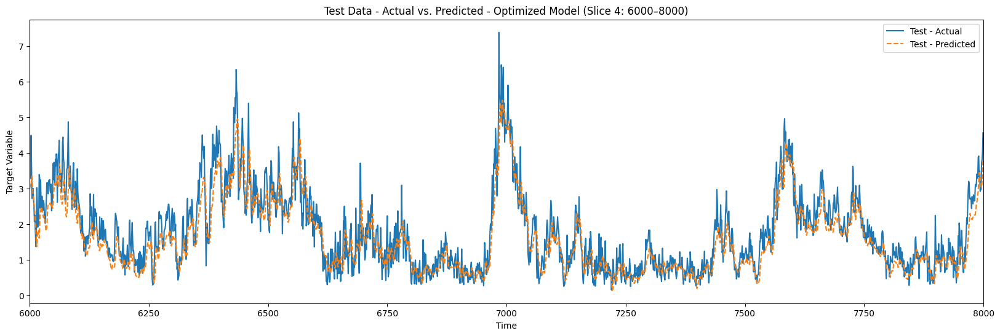

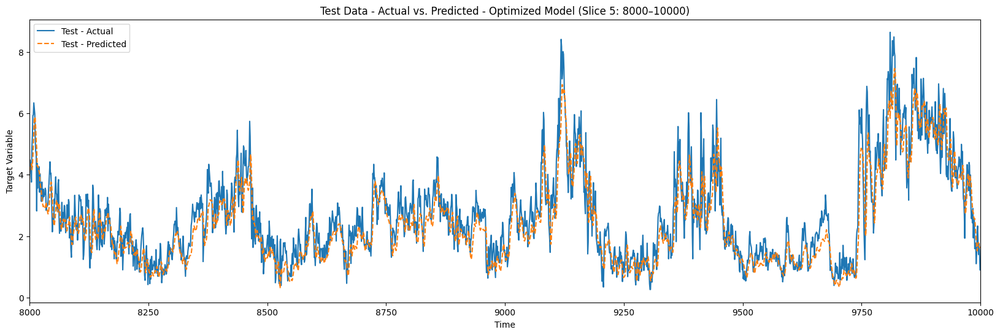

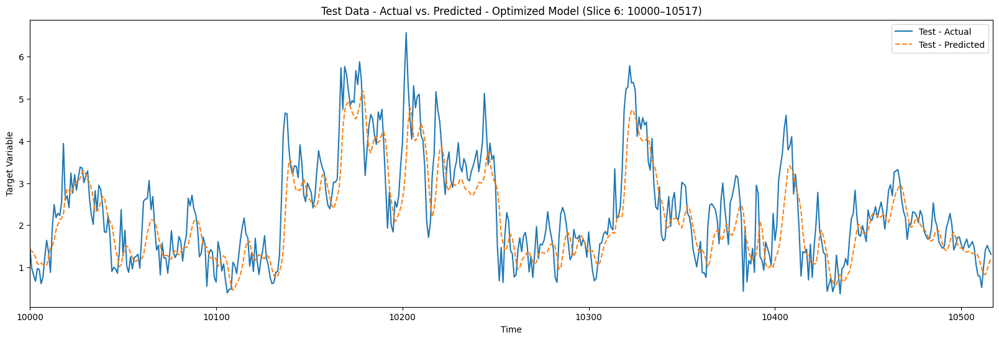

In [ ]:
# plot expanding test data from forecast 12 timesteps 12
x_ranges = [(0, 2000), (2000, 4000), (4000,6000), (6000,8000), (8000,10000), (10000, len(y_test_original_rescaled))]
plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=x_ranges,ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

**Plots from optimized mid model (timesteps = 24, forecast steps =12)**

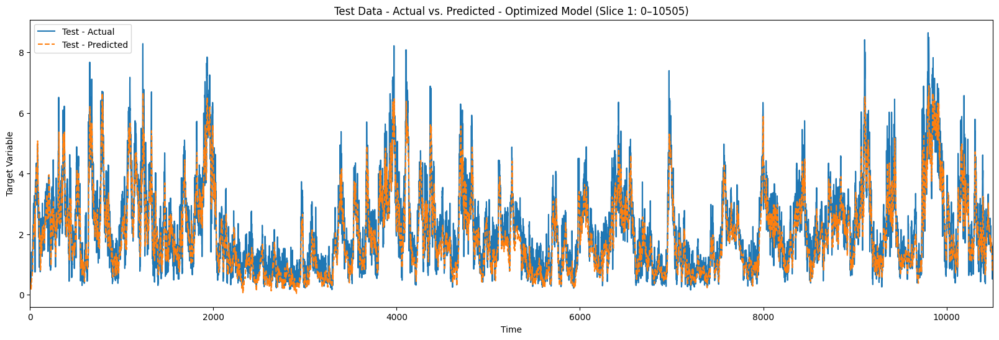

In [ ]:
# plot all test data  from forecast 12 timesteps 24
plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=None, ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

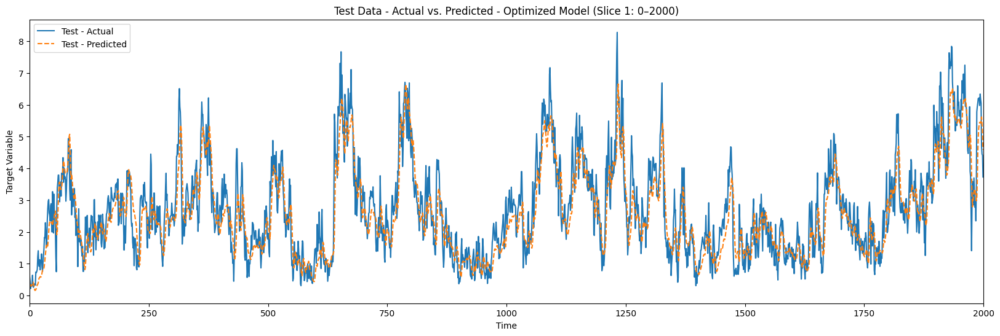

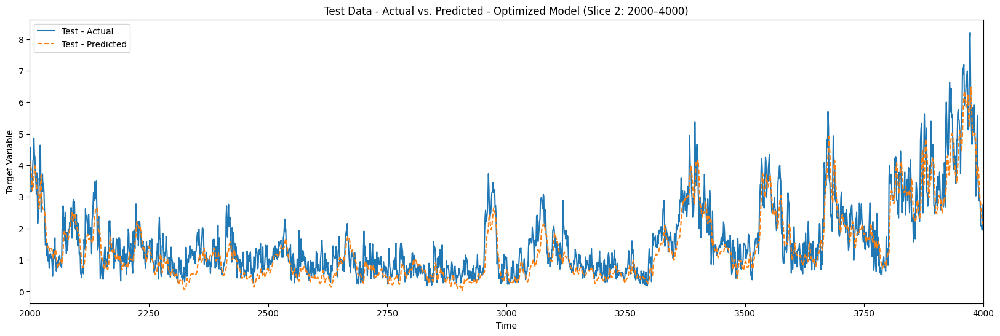

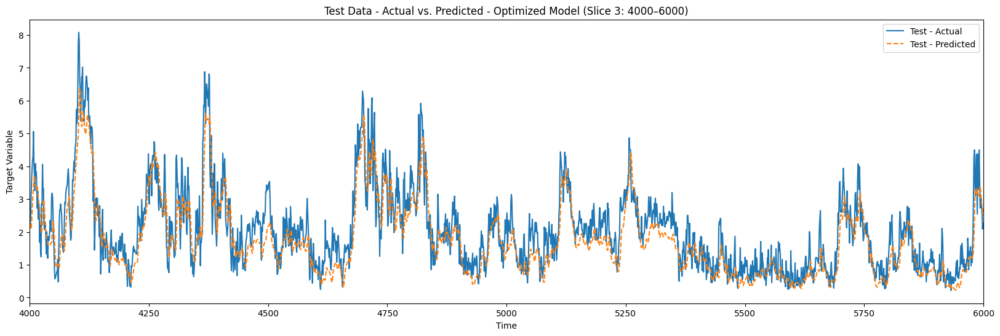

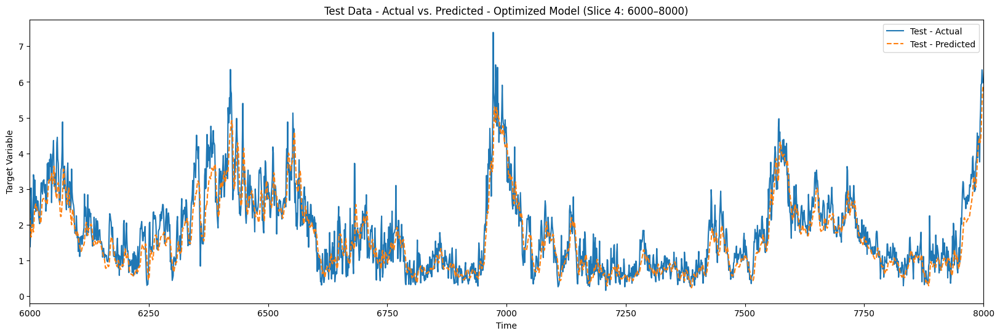

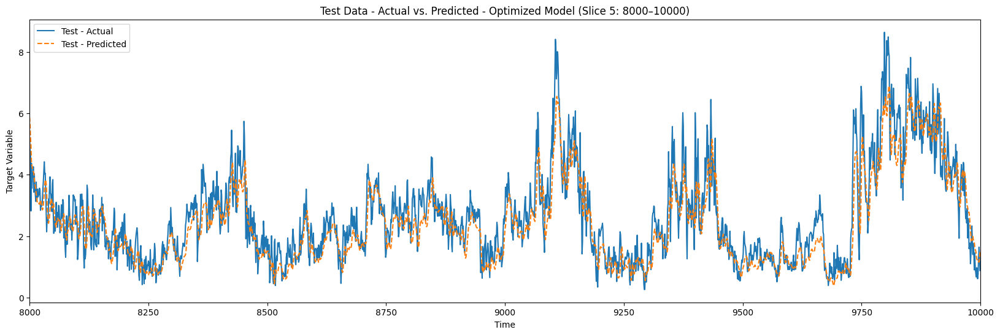

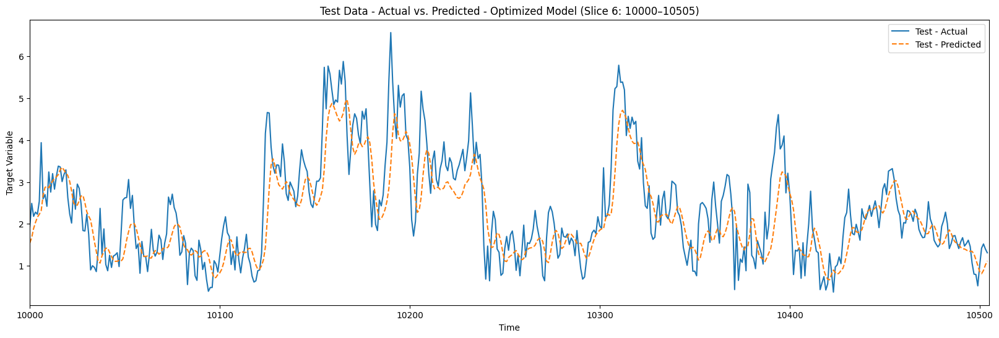

In [ ]:
# plot expanding test data from forecast 12 timesteps 24
x_ranges = [(0, 2000), (2000, 4000), (4000,6000), (6000,8000), (8000,10000), (10000, len(y_test_original_rescaled))]
plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=x_ranges,ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

**Plots from optimized baseline model (timesteps = 24, forecast steps =24)**

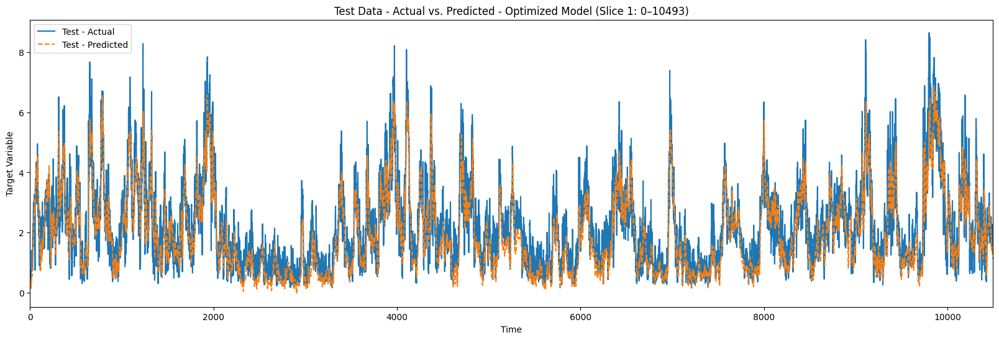

In [ ]:
# plot all test data  from forecast 24 timesteps 24
#plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=None, ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

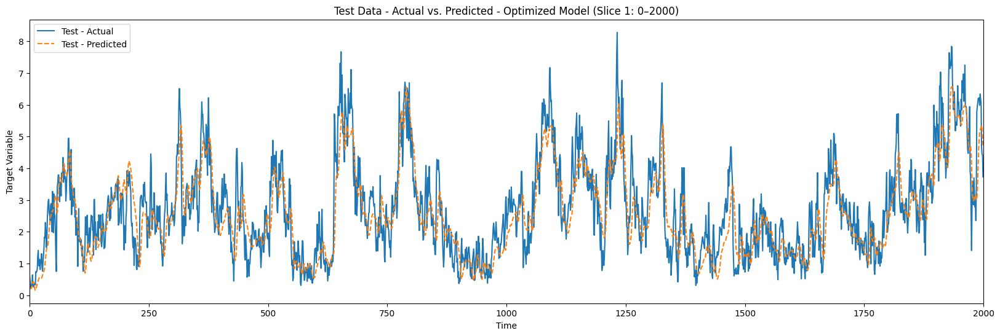

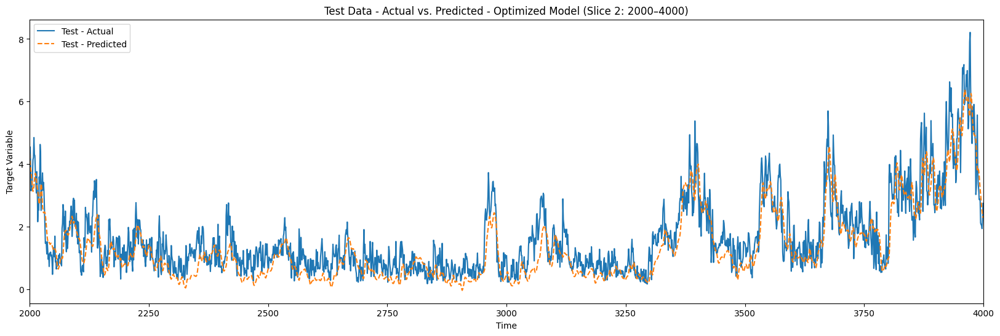

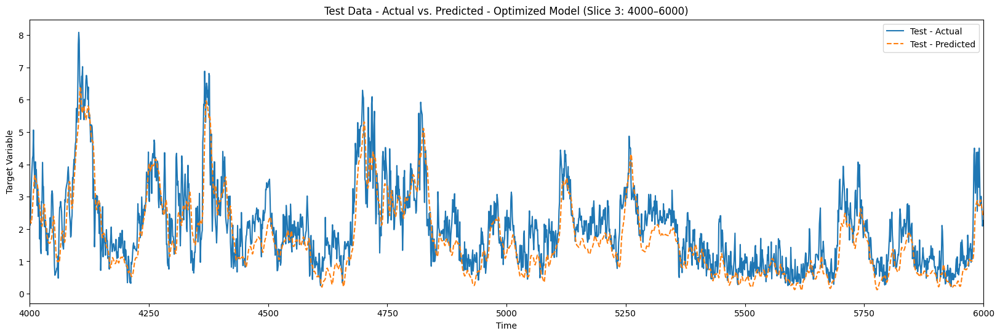

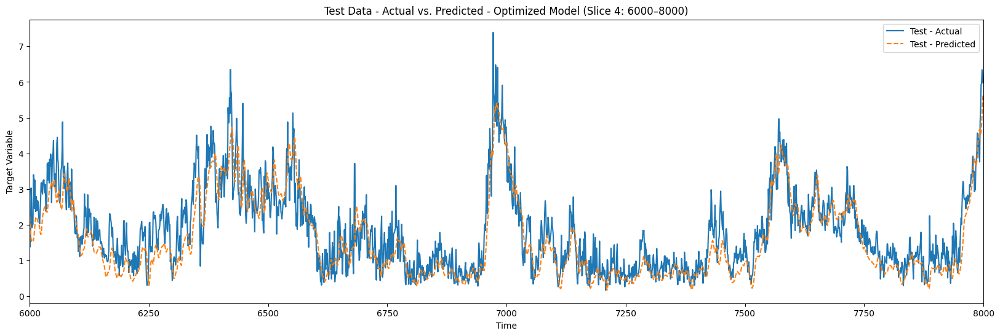

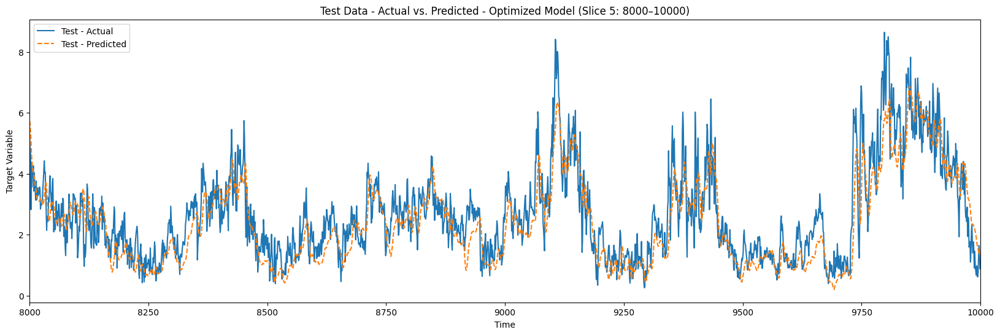

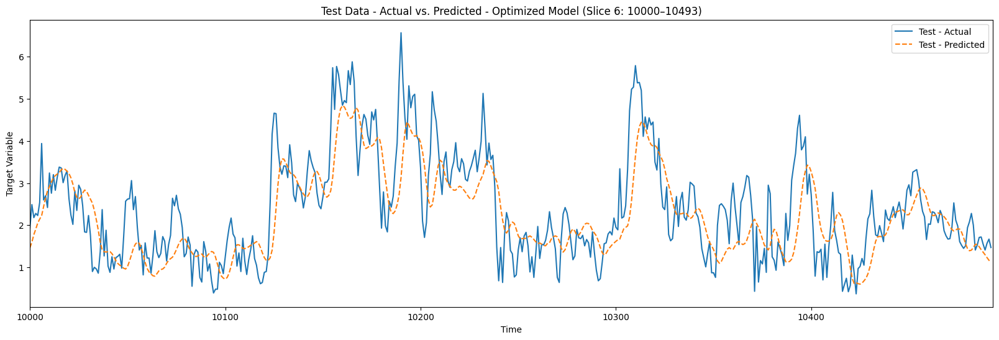

In [ ]:
# plot expanding test data from forecast 24 timesteps 24
#x_ranges = [(0, 2000), (2000, 4000), (4000,6000), (6000,8000), (8000,10000), (10000, len(y_test_original_rescaled))]
#plot_prediction_comparison(y_test_original_rescaled, test_prediction_bestmodel_rescaled, xlims=x_ranges,ylim=None, title="Test Data - Actual vs. Predicted - Optimized Model", xlabel="Time", ylabel="Target Variable")

### Make Future Prediction from Optimized Model

In [ ]:
#copy the last (time steps) sequence
last_sequence = df_model.iloc[-time_steps:].copy()

sequence_tensor = tf.convert_to_tensor(
            last_sequence.values.reshape(1, time_steps, last_sequence.shape[1]),
            dtype=tf.float32
        )
#make future prediction
future_prediction_bestmodel = best_model.predict(sequence_tensor, batch_size=1)
#inverse scaling
future_prediction_rescaled_bestmodel = target_scaler.inverse_transform(future_prediction_bestmodel)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


In [ ]:
# Plot the predictions
plt.figure(figsize=(20, 6))
plt.plot(range(forecast_steps),future_prediction_rescaled_bestmodel[0], label='Future Predicted', marker = 'o')
#plt.ylim(-5,150)
plt.title('Future Prediction')
plt.xlabel('Time Interval Ahead')
plt.ylabel('Target Variable: wind speed, m/s')
plt.legend('none')
plt.show()

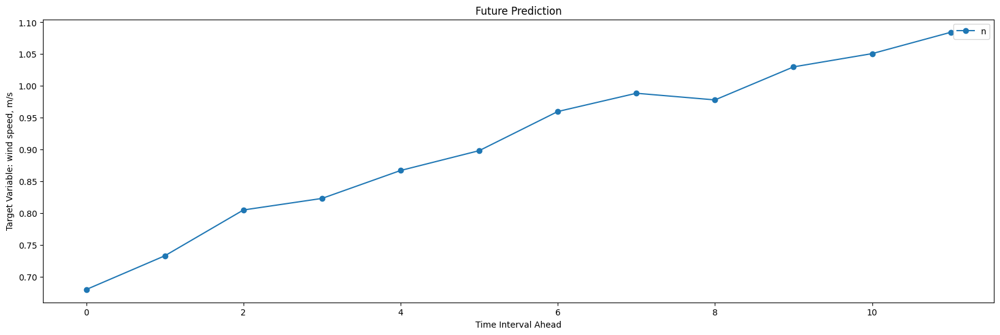

In [ ]:
# Future Prediction for Optimized Best Model (Timesteps = 24, Forecast steps = 12)

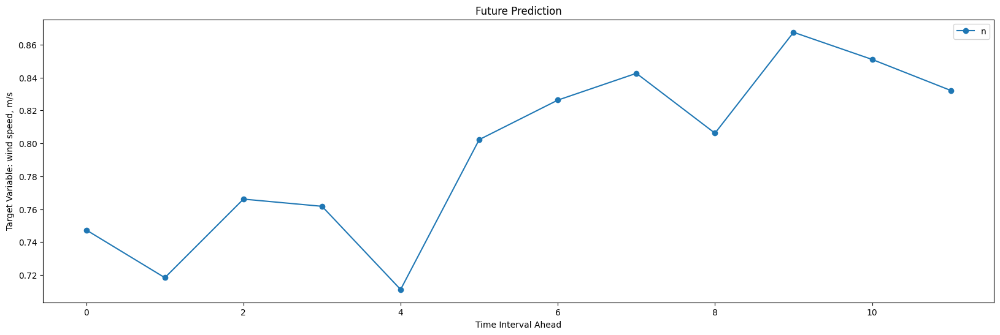

In [ ]:
# Future Prediction for Optimized Best Model (Timesteps = 12, Forecast steps = 12)

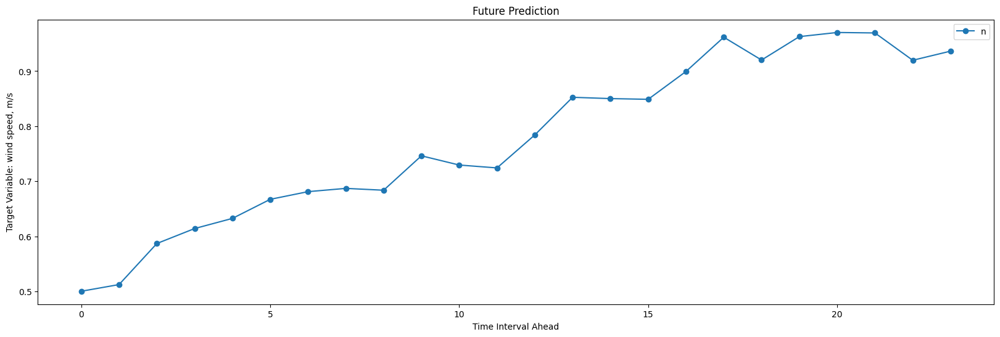

In [ ]:
# Future Prediction for Optimized Baseline Model (Timesteps = 24, Forecast steps = 24)

### Saving the train and test actual and predicted outcome and the future prediction outcome, with time stamp, as dataframe for future plotting

In [ ]:
#extract indices
train_start_index = time_steps
train_end_index = train_start_index + len(train_prediction_bestmodel_rescaled)
test_start_index = train_end_index + time_steps + forecast_steps - 1
test_end_index = test_start_index + len(test_prediction_bestmodel_rescaled)

#train_timestamps = df.index[df.index.isin(df.index[train_start_index:train_end_index])]  # Extract the index (timestamp) for training data
#test_timestamps = df.index[df.index.isin(df.index[test_start_index:test_end_index])]  # Extract the index (timestamp) for test data

train_timestamps = df.index[train_start_index:train_end_index]
test_timestamps = df.index[test_start_index:test_end_index]

In [ ]:
# crosschecking the time stamp of train and test
print(f'train data starts from: {train_timestamps.min()} and ends at: {train_timestamps.max()}')
print(f'test data starts from: {test_timestamps.min()} and ends at: {test_timestamps.max()}')

train data starts from: 2020-01-01 02:10:00 and ends at: 2020-10-19 17:30:00
test data starts from: 2020-10-19 21:30:00 and ends at: 2020-12-31 22:10:00


In [ ]:
# Confirm matching lengths
assert len(train_timestamps) == len(y_train_original_rescaled[:, 0]) == len(train_prediction_bestmodel_rescaled[:, 0])
assert len(test_timestamps) == len(y_test_original_rescaled[:, 0]) == len(test_prediction_bestmodel_rescaled[:, 0])

print("train_timestamps:", len(train_timestamps))
print("y_train_original_rescaled:", len(y_train_original_rescaled[:, 0]))
print("train_prediction_bestmodel_rescaled:", len(train_prediction_bestmodel_rescaled[:, 0]))

print("test_timestamps:", len(test_timestamps))
print("y_test_original_rescaled:", len(y_test_original_rescaled[:, 0]))
print("test_prediction_bestmodel_rescaled:", len(test_prediction_bestmodel_rescaled[:, 0]))

train_timestamps: 42133
y_train_original_rescaled: 42133
train_prediction_bestmodel_rescaled: 42133
test_timestamps: 10517
y_test_original_rescaled: 10517
test_prediction_bestmodel_rescaled: 10517


In [ ]:
train_results_df = pd.DataFrame({
    'train_timestamp': train_timestamps,
    'train_actual': y_train_original_rescaled[:,0],
    'train_predicted': train_prediction_bestmodel_rescaled[:,0]
})

test_results_df = pd.DataFrame({
    'test_timestamp': test_timestamps,
    'test_actual': y_test_original_rescaled[:,0],
    'test_predicted': test_prediction_bestmodel_rescaled[:,0]
})

In [ ]:
# creating combined data from test and future forecast

from datetime import timedelta

last_timestamp = test_results_df['test_timestamp'].iloc[-1]

# Generate future timestamps, 10 minutes apart
future_timestamps = [last_timestamp + timedelta(minutes=10 * i) for i in range(1, forecast_steps+1)]

# Past actuals
past_df = test_results_df[['test_timestamp', 'test_actual', 'test_predicted']].iloc[-time_steps:].copy()
past_df = past_df.rename(columns={'test_timestamp': 'timestamp', 'test_actual': 'actual', 'test_predicted':'prediction'})


# Future predictions
future_df = pd.DataFrame({
    'timestamp': future_timestamps,
    'actual': [None]*forecast_steps,
    'prediction': future_prediction_rescaled_bestmodel[:forecast_steps].flatten()
})

# Combine both
combined_df = pd.concat([past_df, future_df], ignore_index=True)
combined_df

,timestamp,actual,prediction
0,2020-12-31 20:20:00,1.53,1.356480
1,2020-12-31 20:30:00,1.61,1.324584
2,2020-12-31 20:40:00,1.46,1.337043
3,2020-12-31 20:50:00,1.06,1.341989
4,2020-12-31 21:00:00,0.80,1.272895
5,2020-12-31 21:10:00,0.79,1.128309
6,2020-12-31 21:20:00,0.52,0.985641
7,2020-12-31 21:30:00,1.01,0.837750
8,2020-12-31 21:40:00,1.42,0.825865
9,2020-12-31 21:50:00,1.52,0.953716


(0.0, 7.0)

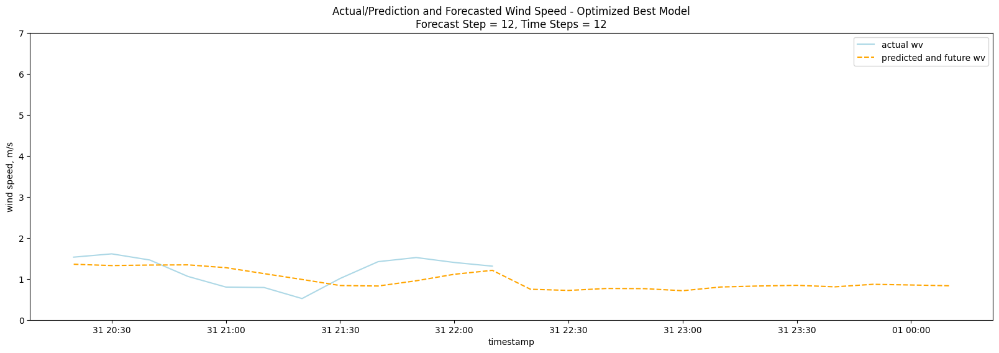

In [ ]:
#plot the forecasted wind speed
plt.figure(figsize=(20, 6))
sns.lineplot(data=combined_df, x='timestamp', y='actual', label='actual wv', color='lightblue')
sns.lineplot(data=combined_df, x='timestamp', y='prediction', label='predicted and future wv', color='orange', ls='--')
plt.ylabel('wind speed, m/s')
plt.title('Actual/Prediction and Forecasted Wind Speed - Optimized Best Model\nForecast Step = 12, Time Steps = 12')
plt.legend()
plt.ylim(0,7)

(0.0, 7.0)

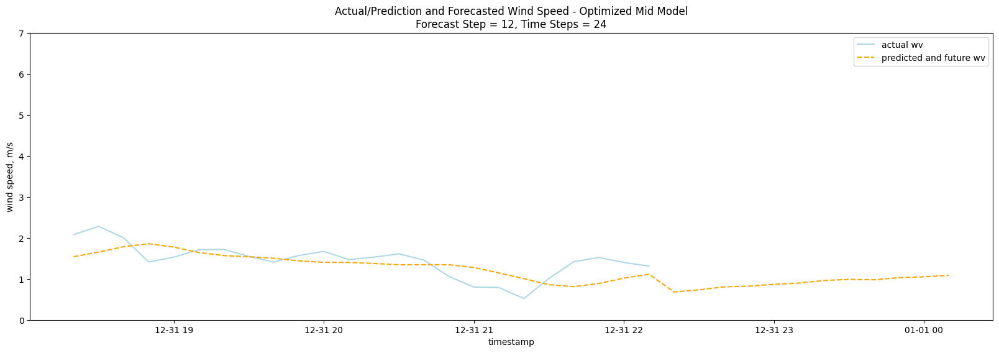

In [ ]:
# Forecast from Optimized Mid Case

(0.0, 7.0)

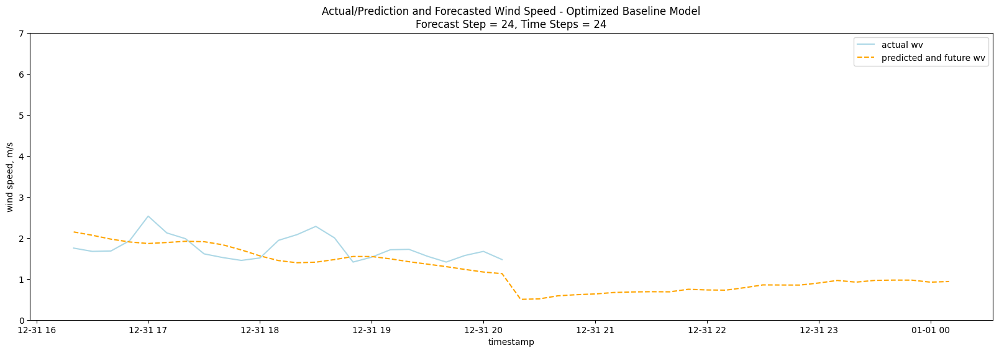

In [ ]:
# Forecast from Optimized Baseline Case